После лекции 4 и практического занятия 4 требуется выполнить три домашних задания:

- Реализовать Q-Learning и сравнить его результаты с реализованными ранее алгоритмами: Cross-Entropy, Monte Carlo, SARSA в задаче Taxi-v3. Для сравнения как минимум нужно использовать графики обучения. 
- Дискретизировать (можно использовать numpy.round()) пространство состояний и обучить Агента решать CartPole-v1, Acrobot-v1, MountainCar-v0, или LunarLander-v2 (одну на выбор) методами Monte Carlo, SARSA и Q-Learning. Сравнить результаты этих алгоритмов и реализованного ранее алгоритма Deep Cross-Entropy на графиках. 
- Придумать стратегию для выбора epsilon позволяющую агенту наилучшим образом решать Taxi-v3 алгоритмом Monte Carlo.

### Отзыв дз1
Алексей, очень хороший отчет. Очень порадовала таблица с результатами. Жаль, что не сделали также же про сглаживание по политикам. Совсем идеальный анализ был бы если бы в этой таблице указывалось не MaxRewad, total_reward усредненный например по 100 запускам, поскольку среда стохастична.
### Отзыв дз2
Алексей, очень хороший отчет. Но в реализации второй задачи есть неточность. Вы решили использовать нормальное распределение для генерации управления, а нейронную сеть применять для определения параметров этого распределения. Так действительно иногда делают, но в этой случае нужно хорошо подумать над тем как учить такую сеть. Ну а в ваше случае написано так "self.loss(self.forward(elite_states), elite_actions)", что означает, что вы хотите сдвигать mu к оптимальным действиям (что еще можно понять), но вы также сдвигаете sigma к оптимальным действиям, что очень странно :) возможно вы просто не обратили внимание на то, что размерность self.forward(elite_states) равна n на 2, а elite_actions - n на 1. Вообще конечно удивительно, что у вас это работает и решает задачу, возможно это связано с тем, что большое sigma позволяет делать хорошее исследования среды, однако в результате работы алгоритма в этой задаче мы очевидно должны пролучить детерминированную политику (или близкую к таковой), то есть с очень малым sigma. То есть при таком подходе sigma нужно либо добавлять в loss как слагаемое, чтобы оно уменьшалось (так скорее всего работать не будет), либо уменьшать ее отдельно (как epsilon). Но вообще здесь эффективно другое решение - использовать нейронную сеть для получения действия и прибавлять к этому действию шум (нормальный или равномерный), который вначале большей, а в конце обучения близок к нулю.
### Отзыв дз3

ИТОГО:

- изображать кривые обучения на одном графике
- сравнение алгоритмов предполагает использование одинаковых общих гиперпараметров
- указывать и приблизительные значения total_reward у полученных политик
- Совсем идеальный вариант - это указывать усредненные значения total_reward по нескольким запускам.


In [79]:
import os
import glob
import gym
import gym_maze
import numpy as np
import random
import time
import tqdm
import json
from collections import Counter
from matplotlib import pyplot as plt
import pandas as pd
exps = list(glob.glob('./experiments/*.json'))

In [49]:
def get_exp_type(fname):
    return fname.split('/')[-1].split('_')[0]


In [70]:
def filter_p1v12(d):
    if not d['name'] in ['mc','ql', 'sarsa']: return True
    if not d['version'] in ('1','2'): return True
    return False
def filter_p1v4(d):
    if not d['name'] in ['mc','ql', 'sarsa']: return True
    if not d['version'] in ('4'): return True
    return False

filter_p2v12
def filter_p2v12(d):
    if not d['name'] in ['mc2','ql2', 'sarsa2']: return True
#     if not d['version'] in ('1','2'): return True
    return False
def filter_p2v10(d):
    if not d['version'] == '10': return True
    return False
def filter_p1v4(d):
    if not d['name'] in ['mc','ql', 'sarsa']: return True
    if not d['version'] in ('4'): return True
    return False

In [50]:
def load_data(ffilter):
    exps = list(glob.glob('./experiments/*.json'))
    data = []
    cnt = Counter()
    for experiment in tqdm.tqdm(exps):
        try:
            d = json.load(open(experiment,'r'))
        except:
            print(experiment)
    #         break
        name = get_exp_type(experiment)
        if ffilter(d): continue

        d['type'] = name.capitalize()
        d['episode_data'] = np.array(d['episode_data'])
        alpha = f"A:{d['params']['alpha']}" if 'alpha' in d['params'] else ''
        d['label'] = f"{d['id']} Name:{d['name']} Eps:{d['params']['epsilon']} \
            Gamma:{d['params']['gamma']} Tn:{d['params']['trajectory_n']} \
            En:{d['params']['epsodes_n']}" + alpha
        cnt.update(d['version'])
        data.append(d)

    g_epsilon = set([d['params']['epsilon'] for d in data])
    g_gamma = set([d['params']['gamma'] for d in data])
    g_epsodes_n = set([d['params']['epsodes_n'] for d in data])
    g_trajectory_n = set([str(d['params']['trajectory_n']) for d in data])

    print(len(data))
    print(g_epsilon)
    print(g_gamma)
    print(g_epsodes_n)
    print(g_trajectory_n)

    for a in [g_epsilon,g_gamma]:
        print(", ".join([f"{float(i):0.5}" for i in sorted(a)]))

    pd_data = []
    for d in tqdm.tqdm(data):
        ed = np.array(d['episode_data'])
        pd_data.append([d['id'], d['name'], d['version'], d['params']['epsilon'], d['params']['gamma'],\
                        d['params']['epsodes_n'], d['params']['trajectory_n'], \
                        d['params']['alpha'] if 'alpha' in d['params'] else None, 
                        d['total_elapsed'],  d['finished'], 
                        len(d['episode_data']), np.max(ed),np.min(ed[-70:]),np.mean(ed),np.mean(ed[:200]), np.mean(ed[-25:]), np.mean(ed[-50:]), np.std(ed[-50:]), 
                        d['episode_data']
                       ])

    df = pd.DataFrame(columns=['id', 'name', 'version', 'Eps', 'gamma', 'Episod', 'Tlen', 'Alpha', 
                               'total_elapsed', 'finished',
                           'len_ed','maxed','min70', 'meaned', 'mean200_ed', 'mean25_ed', 'mean50_ed', 'std_ed'
                           , 'data'
                          ],
                 data = pd_data)
    return df, g_epsilon, g_gamma,g_epsodes_n,g_trajectory_n

In [51]:
df, g_epsilon, g_gamma,g_epsodes_n,g_trajectory_n = load_data(filter_p2v12)

 27%|██▋       | 1365/5050 [00:00<00:00, 6972.75it/s]

5050
{1}
{0.5916530612244898, 0.6120204081632653, 0.6527551020408163, 0.6731224489795918, 0.6323877551020408, 0.6934897959183673, 0.7138571428571429, 0.7342244897959184, 0.7545918367346939, 0.7749591836734694, 0.8564285714285714, 0.04173469387755102, 0.2046734693877551, 0.3676122448979592, 0.5305510204081633, 0.917530612244898, 0.10283673469387755, 0.26577551020408163, 0.4287142857142857, 0.7953265306122449, 0.8156938775510204, 0.9786326530612245, 0.16393877551020408, 0.32687755102040816, 0.48981632653061224, 0.8767959183673469, 0.06210204081632653, 0.2250408163265306, 0.3879795918367347, 0.5509183673469388, 0.9378979591836735, 0.12320408163265306, 0.28614285714285714, 0.4490816326530612, 0.46944897959183673, 0.8360612244897959, 0.999, 0.02136734693877551, 0.1843061224489796, 0.30651020408163265, 0.3472448979591837, 0.5101836734693878, 0.8971632653061224, 0.08246938775510204, 0.24540816326530612, 0.4083469387755102, 0.5712857142857143, 0.14357142857142857, 0.958265306122449, 0.001}
{10

100%|██████████| 5050/5050 [00:00<00:00, 7282.78it/s]


In [52]:
g_epsilon, g_gamma,g_epsodes_n,g_trajectory_n

({1},
 {0.001,
  0.02136734693877551,
  0.04173469387755102,
  0.06210204081632653,
  0.08246938775510204,
  0.10283673469387755,
  0.12320408163265306,
  0.14357142857142857,
  0.16393877551020408,
  0.1843061224489796,
  0.2046734693877551,
  0.2250408163265306,
  0.24540816326530612,
  0.26577551020408163,
  0.28614285714285714,
  0.30651020408163265,
  0.32687755102040816,
  0.3472448979591837,
  0.3676122448979592,
  0.3879795918367347,
  0.4083469387755102,
  0.4287142857142857,
  0.4490816326530612,
  0.46944897959183673,
  0.48981632653061224,
  0.5101836734693878,
  0.5305510204081633,
  0.5509183673469388,
  0.5712857142857143,
  0.5916530612244898,
  0.6120204081632653,
  0.6323877551020408,
  0.6527551020408163,
  0.6731224489795918,
  0.6934897959183673,
  0.7138571428571429,
  0.7342244897959184,
  0.7545918367346939,
  0.7749591836734694,
  0.7953265306122449,
  0.8156938775510204,
  0.8360612244897959,
  0.8564285714285714,
  0.8767959183673469,
  0.8971632653061224,
  

In [53]:
df['version'].unique()

array(['1'], dtype=object)

In [54]:
df.to_csv('reporting_2_data.csv', sep='\t')

In [55]:
def get_max(arr):
    return [np.max(i) for i in arr]


In [56]:
df

,id,name,version,Eps,gamma,Episod,Tlen,Alpha,total_elapsed,finished,len_ed,maxed,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,data
0,1671817162915223486,sarsa2,1,1,0.591653,1000,300,0.30651,48.426719,True,1000,83,-392,-193.993,-194.375,-207.00,-216.98,98.782689,"[-242, -147, -182, -162, -134, -305, -125, -10..."
1,1671817162915740276,sarsa2,1,1,0.612020,1000,300,0.30651,50.512290,True,1000,47,-398,-191.513,-179.765,-229.00,-219.98,88.335834,"[-114, -106, -69, 15, -110, -66, -261, -141, -..."
2,1671817162916252013,sarsa2,1,1,0.632388,1000,300,0.30651,43.485115,True,1000,49,-372,-194.123,-185.850,-191.00,-195.42,81.206180,"[-99, -101, -86, -198, -153, -174, -137, -171,..."
3,1671817162916848557,sarsa2,1,1,0.652755,1000,300,0.30651,50.464710,True,1000,26,-366,-190.547,-179.120,-154.00,-165.84,85.171206,"[-88, -155, -145, -112, -223, -141, -116, -145..."
4,1671817162917472603,sarsa2,1,1,0.673122,1000,300,0.30651,50.205099,True,1000,58,-379,-190.724,-176.315,-195.16,-188.10,89.996055,"[-327, -208, -129, -87, -101, -122, -156, -119..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5045,1671817168056664297,ql2,1,1,0.937898,1000,300,0.99900,39.908033,True,1000,44,-383,-192.755,-187.275,-193.60,-185.62,93.404259,"[-211, -229, -107, -103, -158, -310, -115, -12..."
5046,1671817168057204389,ql2,1,1,0.958265,1000,300,0.99900,44.794896,True,1000,37,-367,-189.326,-177.265,-202.80,-196.58,82.381573,"[-107, -68, -210, -112, -172, -95, -130, -105,..."
5047,1671817168057752134,ql2,1,1,0.978633,1000,300,0.99900,43.601487,True,1000,53,-380,-191.927,-176.565,-185.68,-178.66,94.814895,"[-116, 35, -82, -138, -112, -143, -123, -369, ..."
5048,1671817168058410549,ql2,1,1,0.999000,1000,300,0.99900,40.785661,True,1000,41,-349,-192.325,-185.930,-194.28,-192.54,87.829428,"[-120, -78, -73, -87, -237, -119, -131, -130, ..."


(array([  3.,  12.,  13.,  28.,  72., 148., 275., 472., 686., 828., 913.,
        703., 477., 226., 101.,  30.,  11.,   2.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   1.,   0.,   0.,   1.,   6.,   6.,   5.,   8.,   7.,   4.,
          3.,   3.,   4.,   0.,   1.,   1.]),
 array([-206.261 , -204.7488, -203.2366, -201.7244, -200.2122, -198.7   ,
        -197.1878, -195.6756, -194.1634, -192.6512, -191.139 , -189.6268,
        -188.1146, -186.6024, -185.0902, -183.578 , -182.0658, -180.5536,
        -179.0414, -177.5292, -176.017 , -174.5048, -172.9926, -171.4804,
        -169.9682, -168.456 , -166.9438, -165.4316, -163.9194, -162.4072,
        -160.895 , -159.3828, -157.8706, -156.3584, -154.8462, -153.334 ,
        -151.8218, -150.3096, -148.7974, -147.2852, -145.773 , -144.2608,
        -142.7486, -141.2364, -139.7242, -138.212 , -136.6998, -135.1876,
        -133.6754, -132.1632, -130.651 ]),
 <a list of 50 Patch ob

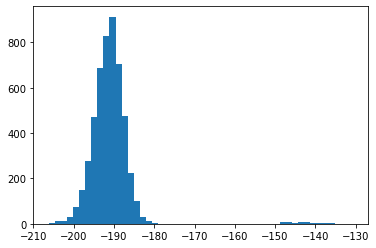

In [57]:
plt.hist(df['meaned'], bins=50)

In [58]:
label_dict = {'mc2':'Monte Carlo','ql2':"Q-Learning",'sarsa2':r'$SARSA$'}

In [59]:
df.shape

(5050, 19)

mc2


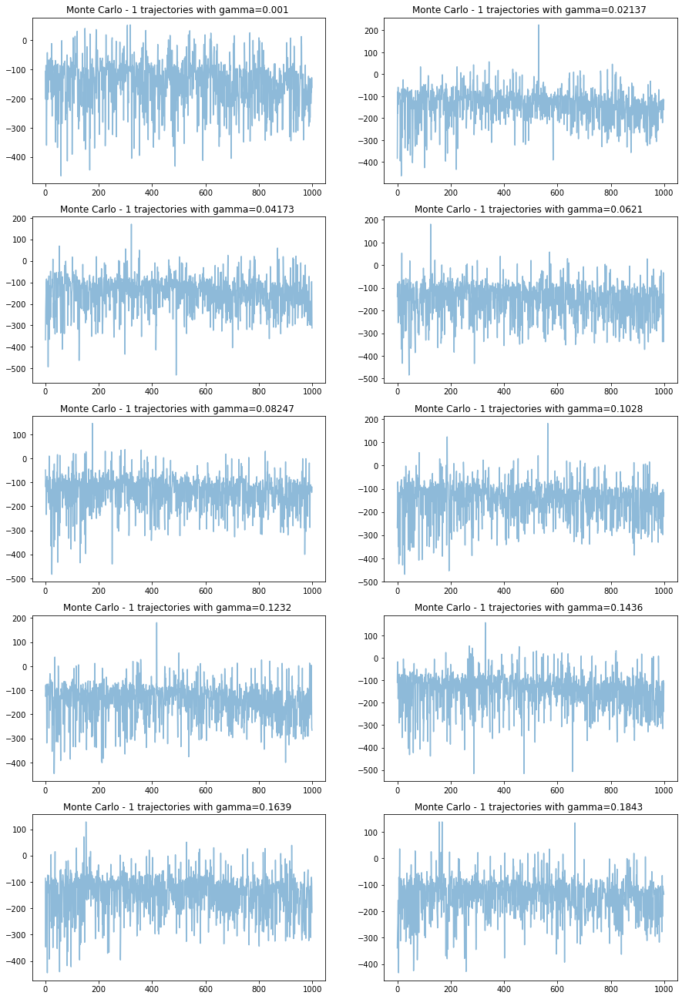

ql2


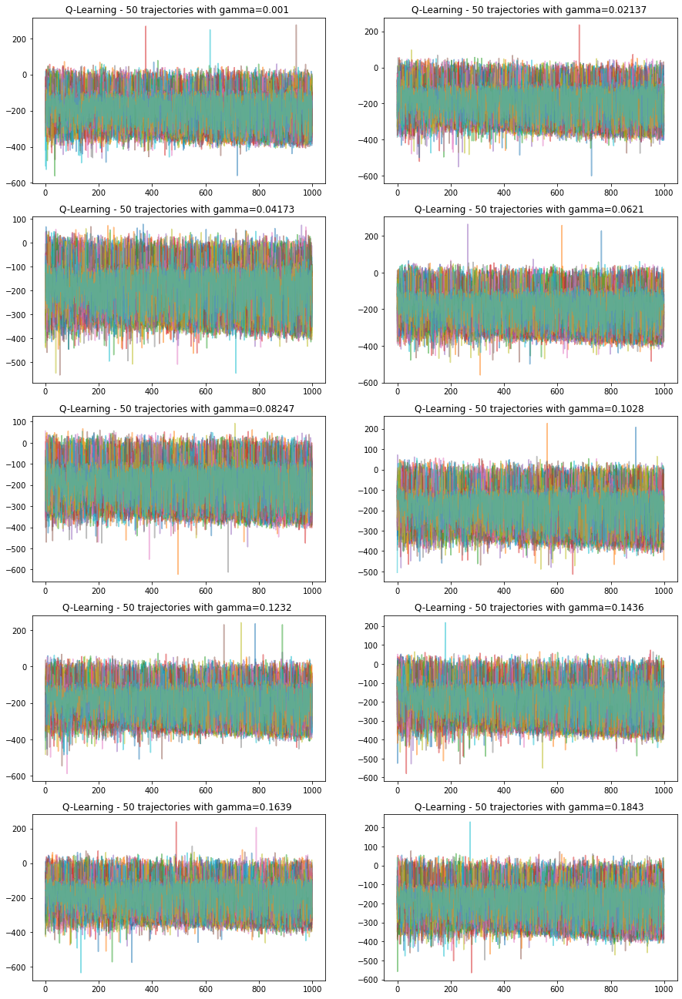

sarsa2


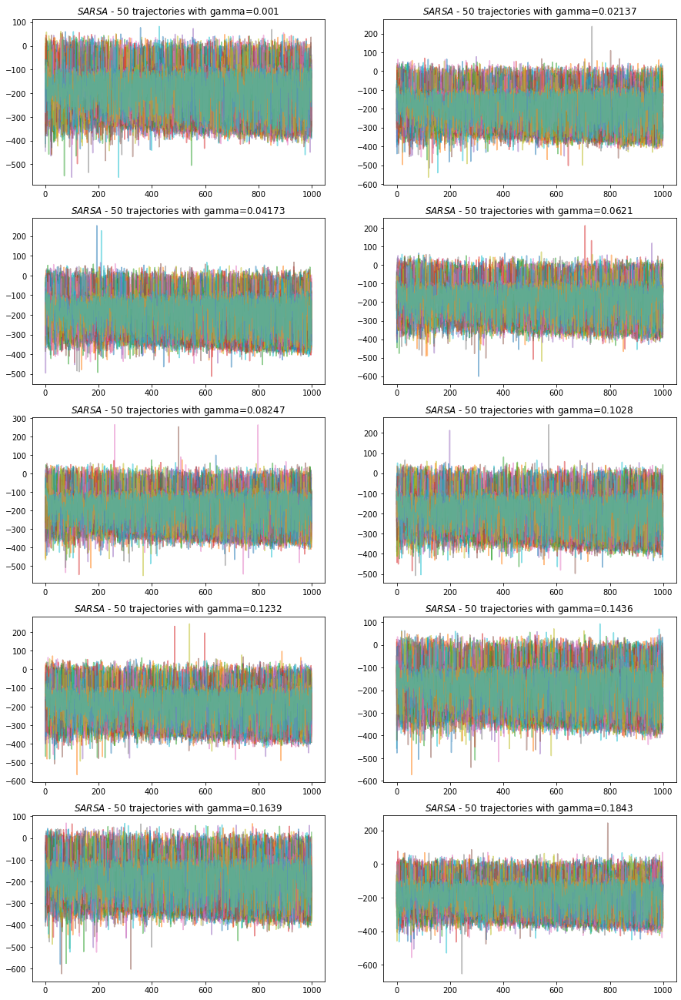

In [61]:
for name in sorted(df['name'].unique()):
    print(name)
    fig, ax = plt.subplots(5,2, figsize=(15,23))
    for i, (g, ax) in enumerate(zip(sorted(g_gamma), ax.reshape((-1)))):
        box_plots = []
        data_len = 1000
        tdf = df.query(f'Tlen == 300 and gamma=={g} and name=="{name}"')['data']
        for row in tdf:
            ax.plot(range(data_len), row, alpha=0.5)
        ax.set_title(f'{label_dict[name]} - {tdf.shape[0]} trajectories with gamma={g:0.4} ')
#         ax.set_ylim((-2000, 100))
#     plt.title(f'{name}')
    plt.show()


In [34]:
from numpy.lib.stride_tricks import sliding_window_view

In [66]:
df.sort_values(by='meaned', ascending=False)

,id,name,version,Eps,gamma,Episod,Tlen,Alpha,total_elapsed,finished,len_ed,maxed,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,data
429,1671817160577180799,mc2,1,1,0.958265,1000,300,NaN,42.125271,True,1000,129,-310,-130.651,-147.455,-119.16,-123.16,59.708411,"[-220, -71, -31, -64, -216, -131, -142, -182, ..."
428,1671817160576737143,mc2,1,1,0.937898,1000,300,NaN,44.486263,True,1000,49,-295,-132.679,-140.085,-116.96,-115.38,54.787915,"[-75, -82, -189, -98, -212, -74, -90, -82, -92..."
425,1671817160575333169,mc2,1,1,0.876796,1000,300,NaN,42.560121,True,1000,54,-282,-135.536,-145.940,-117.48,-127.24,61.273342,"[-83, -202, -218, -96, -84, -110, -138, -90, -..."
422,1671817160574141957,mc2,1,1,0.815694,1000,300,NaN,42.533620,True,1000,123,-315,-135.685,-141.320,-137.72,-143.66,69.476790,"[-203, -118, -232, -397, -107, -80, -73, -82, ..."
423,1671817160574534756,mc2,1,1,0.836061,1000,300,NaN,44.152567,True,1000,82,-366,-135.990,-147.280,-150.32,-142.04,54.119483,"[-94, -175, -106, -140, -272, -206, -62, 14, -..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,1671817163664938728,sarsa2,1,1,0.999000,1000,300,0.815694,39.824944,True,1000,37,-375,-204.601,-192.980,-194.76,-203.32,100.497849,"[-225, -93, -148, -137, -118, -147, -110, -207..."
347,1671817163876220288,sarsa2,1,1,0.958265,1000,300,0.978633,45.798240,True,1000,29,-380,-204.731,-192.785,-214.64,-217.66,95.929476,"[-283, -76, -281, -151, -90, -152, -200, -208,..."
4259,1671817163877153545,sarsa2,1,1,0.999000,1000,300,0.978633,44.387079,True,1000,49,-402,-205.259,-182.115,-198.48,-203.38,88.742750,"[-72, -190, -198, -140, -214, -335, -211, -183..."
2094,1671817163623989116,sarsa2,1,1,0.876796,1000,300,0.795327,40.459675,True,1000,47,-386,-206.170,-198.170,-168.04,-186.82,80.221865,"[-96, -80, -153, -89, -140, -132, -112, -97, -..."


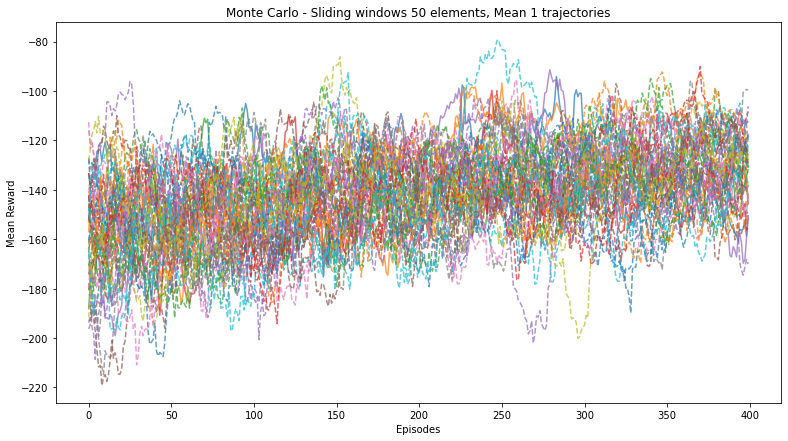

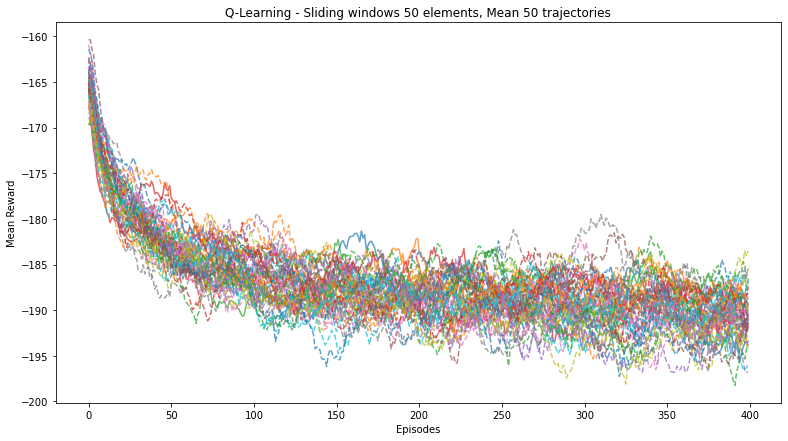

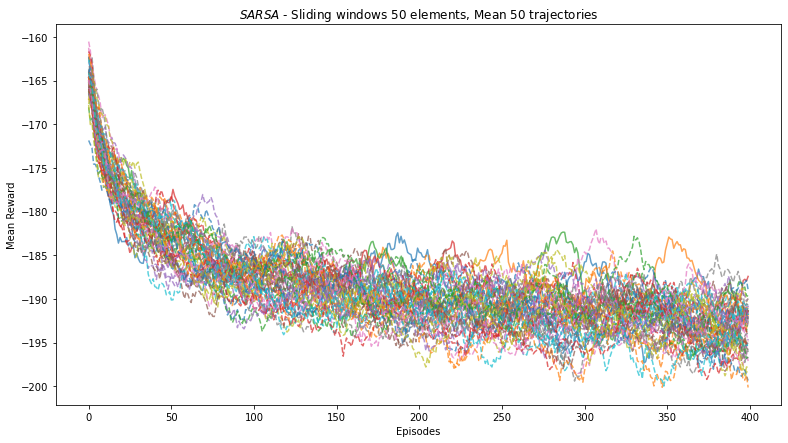

In [63]:

names = sorted(df['name'].unique())


for i, name in enumerate(names):
    fig, ax = plt.subplots(1,1, figsize=(13,7))
    
    data_start = 0
    data_end = 400
    for j, g in enumerate(sorted(g_gamma)):
        tdf = df.query(f'gamma=={g} and name=="{name}"')['data']
        tdf = tdf.apply(lambda x: sliding_window_view(x, 25).mean(axis=1))
        mean_data = tdf.mean()
        x = range(len(mean_data[data_start:data_end]))
        y = mean_data[data_start:data_end]
        label = r'$\gamma$ '+f'{g:0.4}'
        ax.plot(x, y, alpha=0.7, label=label, linestyle='solid' if j<5 else 'dashed')
#         ax.legend((l2, l4), ('oscillatory', 'damped'), loc='upper right', shadow=True)
    ax.set_xlabel('Episodes')
#         ax.set_xlim((data_start, data_end))
    ax.set_ylabel('Mean Reward')
    traj_cnt = df.query(f'Tlen == 300 and name=="{name}"').shape

    ax.set_title(f'{label_dict[name]} - Sliding windows 50 elements, Mean {tdf.shape[0]} trajectories')
#     ax.legend(shadow=False, fancybox=True)
#     ax.set_xticklabels(range(data_start-50, data_end+50, 50))
#     ax.set_xticks(range(data_start, data_end+50, 50))


    plt.show()


KeyError: 'mc2'

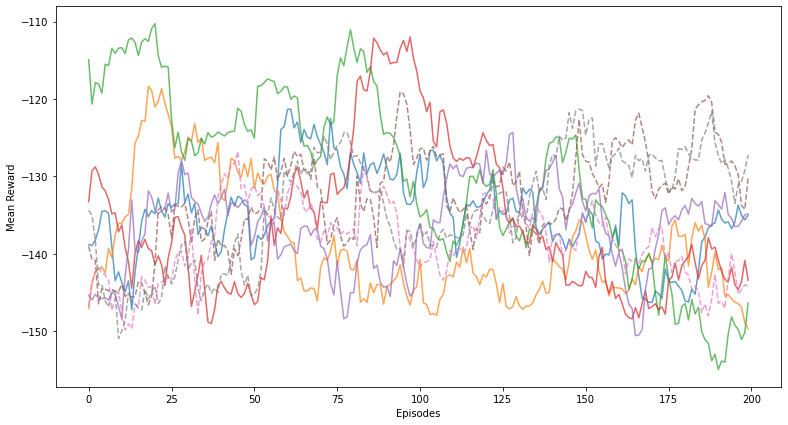

In [37]:

names = sorted(df['name'].unique())


for i, name in enumerate(names):
    data_start = 200
    data_end = 400
    fig, ax = plt.subplots(1,1, figsize=(13,7))
    for j, g in enumerate(list(sorted(g_gamma))[2:10]):
        tdf = df.query(f'Tlen == 300 and gamma=={g} and name=="{name}"')['data']
        tdf = tdf.apply(lambda x: sliding_window_view(x, 50).mean(axis=1))
        mean_data = tdf.mean()
        x = range(len(mean_data[data_start:data_end]))
        y = mean_data[data_start:data_end]
        label = r'$\gamma$ '+f'{g:0.4}'
        ax.plot(x, y, alpha=0.7, label=label, linestyle='solid' if j<5 else 'dashed')
#         ax.legend((l2, l4), ('oscillatory', 'damped'), loc='upper right', shadow=True)
    ax.set_xlabel('Episodes')
#         ax.set_xlim((data_start, data_end))
    ax.set_ylabel('Mean Reward')
    traj_cnt = df.query(f'Tlen == 300 and name=="{name}"').shape
    ax.set_title(f'{label_dict[name]} Sliding windows 50 elements, Mean {traj_cnt[0]} trajectories')
    ax.legend(shadow=True, fancybox=True)
#     plot_lbls_cnt = 8
#     ax.set_xticklabels(range(data_start-plot_step, data_end+plot_step, plot_step))
#     plot_step = 20# ((data_end - data_start+1) //9)+1
    ax.set_xticklabels([data_start -25 + 25*x for x in range(0,10)])


    plt.show()


In [40]:
g_alpha = list(sorted(filter(lambda x: not np.isnan(x), df['Alpha'].unique())))
g_alpha

[0.001,
 0.02136734693877551,
 0.04173469387755102,
 0.06210204081632653,
 0.08246938775510204,
 0.10283673469387755,
 0.12320408163265306,
 0.14357142857142857,
 0.16393877551020408,
 0.1843061224489796,
 0.2046734693877551,
 0.2250408163265306,
 0.24540816326530612,
 0.26577551020408163,
 0.28614285714285714,
 0.30651020408163265,
 0.32687755102040816,
 0.3472448979591837,
 0.3676122448979592,
 0.3879795918367347,
 0.4083469387755102,
 0.4287142857142857,
 0.4490816326530612,
 0.46944897959183673,
 0.48981632653061224,
 0.5101836734693878,
 0.5305510204081633,
 0.5509183673469388,
 0.5712857142857143,
 0.5916530612244898,
 0.6120204081632653,
 0.6323877551020408,
 0.6527551020408163,
 0.6731224489795918,
 0.6934897959183673,
 0.7138571428571429,
 0.7342244897959184,
 0.7545918367346939,
 0.7749591836734694,
 0.7953265306122449,
 0.8156938775510204,
 0.8360612244897959,
 0.8564285714285714,
 0.8767959183673469,
 0.8971632653061224,
 0.917530612244898,
 0.9378979591836735,
 0.958265306

In [45]:
names

['mc2', 'ql2', 'sarsa2']

KeyError: 'ql2'

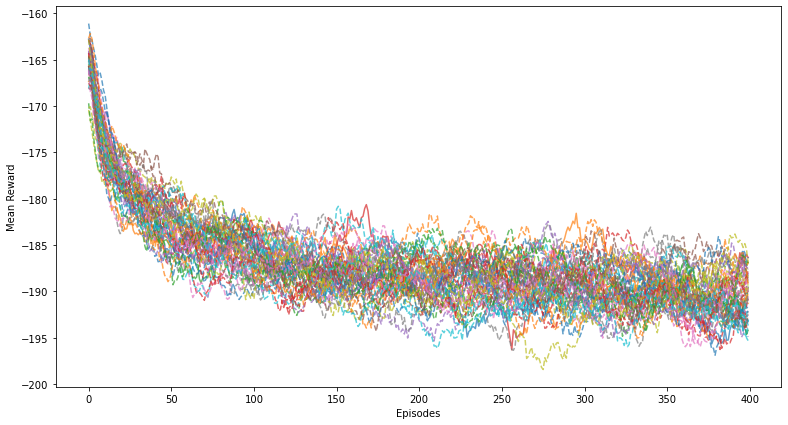

In [47]:

names = sorted(df['name'].unique())


for i, name in enumerate(["ql2","sarsa2"]):
    fig, ax = plt.subplots(1,1, figsize=(13,7))
    
    data_start = 0
    data_end = 400
    for j, a in enumerate(sorted(g_alpha)):
        tdf = df.query(f'Alpha=={a} and name=="{name}"')['data']
        tdf = tdf.apply(lambda x: sliding_window_view(x, 25).mean(axis=1))
        mean_data = tdf.mean()
        x = range(len(mean_data[data_start:data_end]))
        y = mean_data[data_start:data_end]
        label = r'$\alpha$ '+f'{a:0.4}'
        ax.plot(x, y, alpha=0.7, label=label, linestyle='solid' if j<5 else 'dashed')
#         ax.legend((l2, l4), ('oscillatory', 'damped'), loc='upper right', shadow=True)
    ax.set_xlabel('Episodes')
#         ax.set_xlim((data_start, data_end))
    ax.set_ylabel('Mean Reward')
    traj_cnt = df.query(f'Tlen == 300 and name=="{name}"').shape

    ax.set_title(f'{label_dict[name]} - Sliding windows 50 elements, Mean {tdf.shape[0]} trajectories')
    ax.legend(shadow=False, fancybox=True)
#     ax.set_xticklabels(range(data_start-50, data_end+50, 50))
#     ax.set_xticks(range(data_start, data_end+50, 50))


    plt.show()


In [71]:
df, g_epsilon, g_gamma,g_epsodes_n,g_trajectory_n = load_data(filter_p2v10)

100%|██████████| 36/36 [00:00<00:00, 3645.81it/s]

36
{1}
{0.9, 0.8, 0.85, 0.95}
{400}
{'200'}
1.0
0.8, 0.85, 0.9, 0.95


In [76]:
df

,id,name,version,Eps,gamma,Episod,Tlen,Alpha,total_elapsed,finished,len_ed,maxed,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,data
0,1672002912596606770,sarsa2,10,1,0.90,400,200,0.95,8.627167,True,400,68,-304,-111.2625,-107.570,-105.64,-115.84,38.588786,"[-67, -141, -109, -123, -215, -110, -107, -145..."
1,1672002909220674848,mc2,10,1,0.80,400,200,NaN,9.963766,True,400,42,-167,-128.9925,-143.935,-98.76,-104.28,38.040526,"[-367, -68, -394, -90, -223, -85, -207, -300, ..."
2,1672002909221633444,mc2,10,1,0.85,400,200,NaN,11.969478,True,400,50,-299,-131.0450,-144.745,-107.52,-109.70,39.914033,"[-221, -106, -194, -218, -222, -19, -231, -137..."
3,1672002909222239422,mc2,10,1,0.90,400,200,NaN,13.759089,True,400,59,-246,-129.8675,-142.475,-119.56,-110.38,50.084285,"[-143, -71, -218, -95, -389, -160, -228, -398,..."
4,1672002909247940561,mc2,10,1,0.95,400,200,NaN,13.521481,True,400,59,-207,-122.4475,-132.425,-106.08,-112.78,37.596431,"[-70, -135, -93, -217, -212, -139, -90, -24, -..."
5,1672002912589674909,sarsa2,10,1,0.80,400,200,0.80,8.828267,True,400,168,-157,-112.2350,-109.990,-109.40,-109.28,35.820687,"[-26, -113, -159, -147, -170, -135, -107, -118..."
6,1672002912590429275,sarsa2,10,1,0.85,400,200,0.80,9.271274,True,400,71,-295,-107.9750,-108.535,-106.28,-101.22,49.287033,"[-145, -34, -27, -112, -90, -89, -105, -107, -..."
7,1672002912590934910,sarsa2,10,1,0.90,400,200,0.80,9.075425,True,400,65,-184,-113.2575,-113.145,-120.80,-115.62,28.414707,"[-93, -150, -90, -111, -118, -176, -102, -112,..."
8,1672002912591509223,sarsa2,10,1,0.95,400,200,0.80,8.542887,True,400,71,-176,-110.4900,-111.250,-98.72,-106.02,35.955244,"[-282, -267, -96, -101, -459, -117, -112, -122..."
9,1672002912591939904,sarsa2,10,1,0.80,400,200,0.85,8.494791,True,400,69,-266,-111.5025,-112.955,-116.12,-115.34,36.512798,"[-147, -205, -158, -85, -87, -126, -99, -163, ..."


In [77]:
df, g_epsilon, g_gamma,g_epsodes_n,g_trajectory_n = load_data(lambda x: x['version']!='12')

100%|██████████| 36/36 [00:00<00:00, 4079.84it/s]

36
{1}
{0.8, 0.85, 0.95, 0.9}
{10000}
{'1000'}
1.0
0.8, 0.85, 0.9, 0.95


In [78]:
df

,id,name,version,Eps,gamma,Episod,Tlen,Alpha,total_elapsed,finished,len_ed,maxed,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,data
0,1672004039189632425,sarsa2,12,1,0.80,10000,1000,0.95,189.006919,True,10000,89,-237,-111.8059,-110.695,-107.84,-111.08,40.907623,"[-103, -87, -83, -107, -121, -61, -78, -101, 6..."
1,1672004036176470277,mc2,12,1,0.80,10000,1000,NaN,338.306945,True,10000,248,-170,-127.5927,-162.295,-95.20,-103.90,37.608643,"[-186, -200, -46, -62, -311, -129, -376, -145,..."
2,1672004036177040079,mc2,12,1,0.85,10000,1000,NaN,291.669618,True,10000,119,-306,-127.9652,-157.060,-107.16,-116.62,52.097175,"[-201, -117, -368, -347, -271, -51, -240, -92,..."
3,1672004036177451396,mc2,12,1,0.90,10000,1000,NaN,326.167158,True,10000,149,-279,-128.5496,-166.715,-110.64,-111.98,48.474525,"[-96, -98, -155, -119, -375, -107, -140, -178,..."
4,1672004036177866671,mc2,12,1,0.95,10000,1000,NaN,331.394664,True,10000,278,-228,-127.0924,-157.015,-121.08,-113.32,33.617519,"[-274, -98, -76, -126, -83, -120, -99, -128, -..."
5,1672004039159569589,sarsa2,12,1,0.80,10000,1000,0.80,159.946342,True,10000,278,-261,-111.5551,-113.805,-115.36,-114.50,38.617742,"[-61, -28, -94, -103, -117, -118, -93, -156, -..."
6,1672004039160209362,sarsa2,12,1,0.85,10000,1000,0.80,211.274056,True,10000,241,-175,-111.0033,-112.225,-113.72,-118.80,21.896118,"[-137, -53, -95, -112, -135, -114, -91, -121, ..."
7,1672004039160728719,sarsa2,12,1,0.90,10000,1000,0.80,208.072104,True,10000,86,-165,-111.2523,-111.385,-116.08,-115.66,38.320026,"[-111, -68, -148, -126, -101, -142, -98, -109,..."
8,1672004039183458058,sarsa2,12,1,0.95,10000,1000,0.80,158.484807,True,10000,272,-153,-111.5883,-111.270,-113.24,-110.32,21.517844,"[-117, -101, -112, -75, -84, -54, -107, 5, -63..."
9,1672004039184288357,sarsa2,12,1,0.80,10000,1000,0.85,210.468534,True,10000,82,-299,-111.1037,-112.810,-120.92,-117.52,39.334077,"[-131, -234, -71, -100, -100, -101, -108, -182..."


# version 3

In [289]:
mcdf, g_epsilon, g_gamma,g_epsodes_n,g_trajectory_n = load_data(filter_p1v4)

100%|██████████| 100/100 [00:00<00:00, 5559.64it/s]

100
{1}
{0.9876767676767677, 0.9918989898989898, 0.9959292929292929, 0.98, 0.9803838383838384, 0.9807676767676767, 0.9811515151515151, 0.9824949494949495, 0.9855656565656565, 0.9943939393939394, 0.9895959595959596, 0.9886363636363636, 0.9974646464646465, 0.9859494949494949, 0.9947777777777778, 0.984989898989899, 0.9938181818181818, 0.9823030303030302, 0.9911313131313131, 0.9851818181818182, 0.984030303030303, 0.9928585858585859, 0.9813434343434343, 0.9901717171717171, 0.999, 0.9963131313131313, 0.9830707070707071, 0.9892121212121212, 0.9980404040404041, 0.9953535353535353, 0.9865252525252525, 0.9970808080808081, 0.9917070707070706, 0.9872929292929293, 0.9846060606060606, 0.9934343434343434, 0.9819191919191919, 0.9907474747474747, 0.9836464646464647, 0.9924747474747475, 0.9897878787878788, 0.9986161616161616, 0.98710101010101, 0.9888282828282828, 0.9976565656565657, 0.9861414141414141, 0.994969696969697, 0.9878686868686869, 0.9826868686868687, 0.9801919191919192, 0.9805757575757575, 0.9

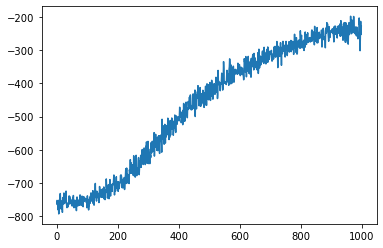

In [290]:
plt.plot(mcdf['data'].mean())

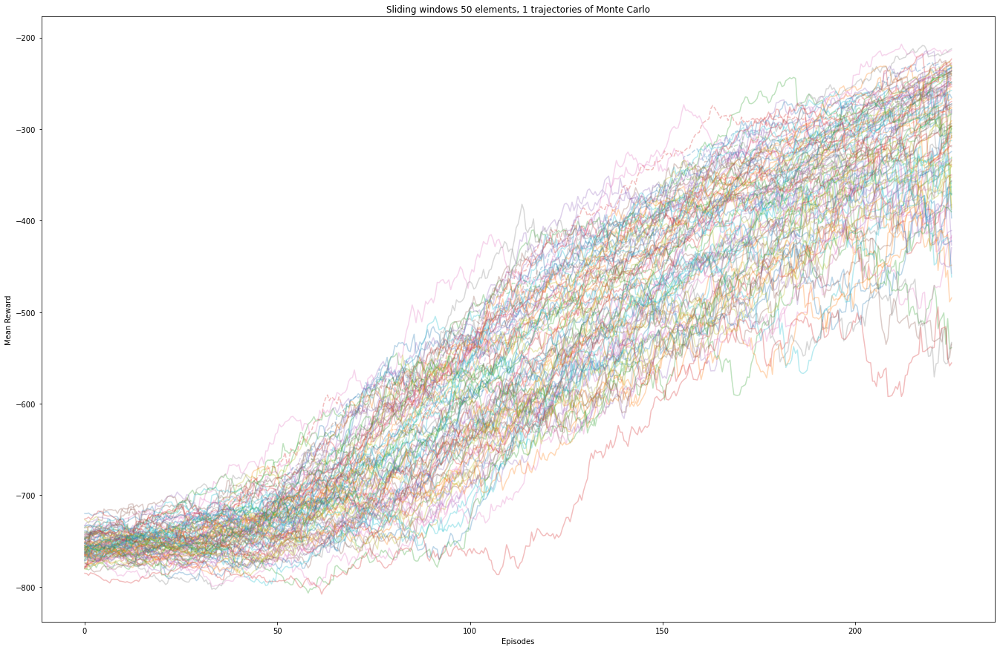

In [259]:
label_dict = {'mc':'Monte Carlo','ql':"Q-Learning",'sarsa':r'$SARSA$'}
names = sorted(mcdf['name'].unique())

fig, ax = plt.subplots(1,1, figsize=(23,15))
name = 'mc'
data_start = 0
data_end = 500
for j, g in enumerate(sorted(g_gamma)):
    tdf = mcdf.query(f'gamma=={g}')['data']
    tdf = tdf.apply(lambda x: sliding_window_view(x, 50).mean(axis=1))
    mean_data = tdf.mean()
    x = range(len(mean_data[data_start:data_end]))
    y = mean_data[data_start:data_end]
    label = r'$\gamma$ '+f'{g:0.4}'
    ax.plot(x, y, alpha=0.3,
#             label=label,
            linestyle='solid' if j>5 else 'dashed')
#         ax.legend((l2, l4), ('oscillatory', 'damped'), loc='upper right', shadow=True)
ax.set_xlabel('Episodes')
#         ax.set_xlim((data_start, data_end))
ax.set_ylabel('Mean Reward')
ax.set_title(f'Sliding windows 50 elements, {tdf.shape[0]} trajectories of {label_dict[name]}')
# ax.legend(shadow=True, fancybox=True)
ax.set_xticklabels(range(data_start-50, data_end+50, 50))
#     ax.set_xticks(range(data_start, data_end+50, 50))


plt.show()


In [ ]:
plt.figure(figsize=(10,10))
data_len = 1000
for row in df.query('Tlen == 300 and gamma==0.001000 and name=="mc"')['data']:
    plt.plot(range(data_len), row, alpha=0.3)
plt.show()

In [126]:


df[(df['Tlen']==300) & (df['gamma']==0.001000)]

,id,name,version,Eps,gamma,Episod,Tlen,Alpha,total_elapsed,finished,len_ed,maxed,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,data
2,1671672886069265320,mc,1,0.001000,0.001,1000,300,NaN,49.312507,True,1000,-13,-272,-479.963,-727.150,-207.92,-214.94,14.580000,"[-200, -506, -803, -821, -857, -821, -830, -86..."
30,1671672886086915314,mc,1,0.111889,0.001,1000,300,NaN,47.810499,True,1000,8,-272,-477.122,-723.710,-206.84,-214.40,17.451647,"[-254, -803, -812, -740, -722, -830, -713, -91..."
71,1671672886100674068,mc,1,0.222778,0.001,1000,300,NaN,49.592229,True,1000,-19,-290,-483.860,-711.755,-206.48,-214.76,16.958255,"[-344, -767, -821, -677, -857, -785, -821, -74..."
99,1671672886114100418,mc,1,0.333667,0.001,1000,300,NaN,47.296653,True,1000,-37,-254,-461.352,-697.105,-206.84,-211.90,17.020282,"[-299, -763, -749, -848, -740, -650, -767, -85..."
127,1671672886127273887,mc,1,0.444556,0.001,1000,300,NaN,50.326450,True,1000,-26,-272,-474.094,-717.945,-207.20,-210.82,16.979623,"[-479, -812, -767, -812, -758, -947, -785, -83..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3197,1671672887396016432,sarsa,1,0.333667,0.001,1000,300,0.666333,33.392860,True,1000,-150,-209,-215.299,-270.780,-200.36,-200.72,2.441639,"[-431, -830, -560, -785, -560, -515, -353, -65..."
3234,1671672886444775127,sarsa,1,0.888111,0.001,1000,300,0.001000,33.941628,True,1000,-200,-209,-215.401,-270.575,-200.72,-200.54,2.137382,"[-758, -794, -605, -623, -704, -668, -443, -31..."
3251,1671672887513522383,sarsa,1,0.001000,0.001,1000,300,0.777222,33.361210,True,1000,9,-218,-214.817,-269.720,-200.72,-201.08,3.434181,"[-767, -839, -668, -569, -551, -587, -283, -67..."
3275,1671672886463955229,sarsa,1,0.999000,0.001,1000,300,0.001000,35.180037,True,1000,-200,-209,-215.057,-269.250,-200.36,-200.54,2.137382,"[-929, -731, -605, -623, -623, -686, -686, -69..."


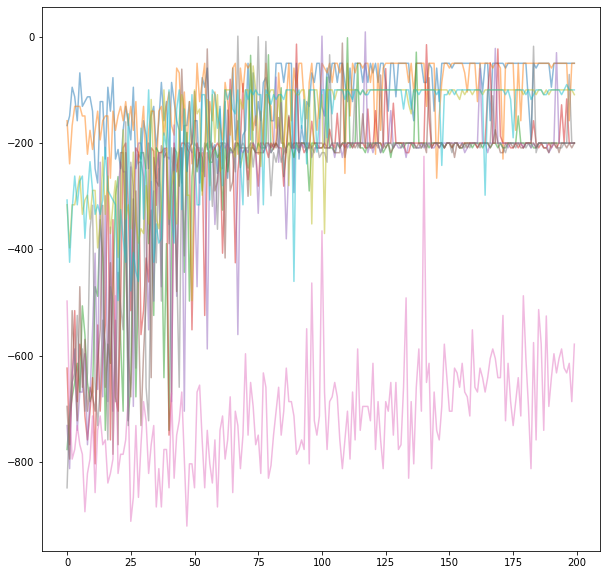

In [44]:
idx = 475

sample = np.random.choice(data, size = 10, replace=False)
for s in sample:
    plt.plot(range(len(s['episode_data'][:200])), s['episode_data'][:200], alpha=0.5)

In [536]:
df[df['id']=='2292098547091']

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3


In [537]:
df

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,65771456929,11,0.150,200,50,1000,0.500,3623.656214,True,200,...,-39.598019,-30.927994,-30.927994,-32.156485,-32.450967,4.008298,1,50,None,None
1,65772251499,11,0.200,200,50,1000,0.500,3563.412664,True,200,...,-39.527885,-32.875247,-32.875247,-32.128155,-32.924760,3.691733,1,50,None,None
2,65773318406,11,0.300,200,50,1000,0.500,3677.951497,True,200,...,-39.528288,-32.458679,-32.458679,-30.920269,-32.052127,4.340452,1,50,None,None
3,65774252849,11,0.400,200,50,1000,0.500,3587.621751,True,200,...,-39.611803,-29.077089,-29.077089,-31.864193,-32.658231,3.857015,1,50,None,None
4,65775238157,11,0.100,200,50,1000,0.500,3624.185472,True,200,...,-39.447066,-31.177327,-31.177327,-31.325184,-31.323147,4.334251,1,50,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174,71113395173,13,0.001,400,50,1000,0.975,7114.904076,True,400,...,-11.307189,-9.005322,-18.077683,10.338000,8.185675,8.726390,1,100,None,None
175,71150766923,13,0.005,400,50,1000,0.975,5541.088187,True,400,...,34.635397,34.458972,12.882586,58.507951,58.587538,6.907679,1,100,None,None
176,77770533742,14,0.005,400,200,1000,0.975,6290.084609,False,122,...,1.930676,20.180268,20.180268,53.039783,46.721266,12.535601,1,200,None,None
177,77805012410,14,0.005,400,200,1000,0.980,6272.647309,False,115,...,-3.752540,12.484988,12.484988,44.563952,36.475965,16.124878,1,200,None,None


In [540]:
df.sort_values('maxed', ascending=False).head(10)

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
106,68866188997,12,0.30,400,50,1000,0.975,8128.821393,True,400,...,-42.500439,13.144885,33.505993,-23.976940,-24.574392,9.971445,1,50,None,None
163,70720468754,13,0.40,400,50,1000,0.950,8665.701207,True,400,...,-46.963037,-4.566845,-19.362150,-29.866501,-24.787488,15.651089,1,100,None,None
76,68448510492,12,0.10,400,50,1000,0.875,8740.987881,True,400,...,-16.261921,8.031807,-16.504626,26.791318,37.850316,20.632709,1,50,None,None
154,70410068197,13,0.30,400,50,1000,0.925,9117.359857,True,400,...,-40.960405,-14.192356,-0.907043,-26.662167,-26.777862,6.797995,1,100,None,None
92,68666199134,12,0.10,400,50,1000,0.925,7970.621362,True,400,...,-16.542854,20.071724,-0.646137,42.518090,35.872741,27.032341,1,50,None,None
172,71037817017,13,0.10,400,50,1000,0.975,5869.773415,True,400,...,-6.262414,36.867827,21.148438,50.989577,51.793675,22.138917,1,100,None,None
81,68514409868,12,0.20,400,50,1000,0.900,7534.220952,True,400,...,-19.671361,30.318784,25.557062,51.124019,43.957877,17.601949,1,50,None,None
104,68837581774,12,0.15,400,50,1000,0.975,6892.309365,True,400,...,27.188403,38.189878,33.583332,52.601916,54.457768,10.282173,1,50,None,None
165,70787338684,13,0.01,400,50,1000,0.950,6505.109896,True,400,...,-2.605563,34.849391,20.590285,32.569148,44.162642,18.909370,1,100,None,None
169,70931428079,13,0.20,400,50,1000,0.975,6302.759434,True,400,...,-6.571065,25.657074,6.487657,29.590353,41.020777,20.756274,1,100,None,None


In [541]:
df.sort_values('mean50_ed', ascending=False).head(10)

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
175,71150766923,13,0.005,400,50,1000,0.975,5541.088187,True,400,...,34.635397,34.458972,12.882586,58.507951,58.587538,6.907679,1,100,None,None
111,68951149675,12,0.005,400,50,1000,0.975,7729.784511,True,400,...,41.444864,25.066014,-3.382777,58.050935,58.502414,6.770584,1,50,None,None
109,68917656421,12,0.010,400,50,1000,0.975,7150.666041,True,400,...,24.552023,33.997689,14.211514,57.971843,57.335162,6.405665,1,50,None,None
167,70858516335,13,0.005,400,50,1000,0.950,6576.175989,True,400,...,33.773333,30.529213,11.765238,53.564418,55.739846,7.676318,1,100,None,None
173,71076239173,13,0.010,400,50,1000,0.975,5603.157811,True,400,...,15.136737,41.412400,28.500165,56.156445,55.712784,11.728456,1,100,None,None
104,68837581774,12,0.150,400,50,1000,0.975,6892.309365,True,400,...,27.188403,38.189878,33.583332,52.601916,54.457768,10.282173,1,50,None,None
101,68796186114,12,0.010,400,50,1000,0.950,6806.808478,True,400,...,7.908864,33.237595,17.036448,56.847250,53.169186,10.200043,1,50,None,None
156,70477708732,13,0.100,400,50,1000,0.925,7616.802451,True,400,...,5.605551,21.445806,-8.032287,55.302512,52.799796,16.734677,1,100,None,None
172,71037817017,13,0.100,400,50,1000,0.975,5869.773415,True,400,...,-6.262414,36.867827,21.148438,50.989577,51.793675,22.138917,1,100,None,None
93,68682978133,12,0.010,400,50,1000,0.925,7416.258458,True,400,...,29.092516,31.990777,14.841789,53.291960,51.104011,8.309830,1,50,None,None


In [542]:
df.sort_values('mean25_ed', ascending=False).head(10)

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
175,71150766923,13,0.005,400,50,1000,0.975,5541.088187,True,400,...,34.635397,34.458972,12.882586,58.507951,58.587538,6.907679,1,100,None,None
111,68951149675,12,0.005,400,50,1000,0.975,7729.784511,True,400,...,41.444864,25.066014,-3.382777,58.050935,58.502414,6.770584,1,50,None,None
109,68917656421,12,0.010,400,50,1000,0.975,7150.666041,True,400,...,24.552023,33.997689,14.211514,57.971843,57.335162,6.405665,1,50,None,None
101,68796186114,12,0.010,400,50,1000,0.950,6806.808478,True,400,...,7.908864,33.237595,17.036448,56.847250,53.169186,10.200043,1,50,None,None
173,71076239173,13,0.010,400,50,1000,0.975,5603.157811,True,400,...,15.136737,41.412400,28.500165,56.156445,55.712784,11.728456,1,100,None,None
156,70477708732,13,0.100,400,50,1000,0.925,7616.802451,True,400,...,5.605551,21.445806,-8.032287,55.302512,52.799796,16.734677,1,100,None,None
157,70511984977,13,0.010,400,50,1000,0.925,6988.279839,True,400,...,15.902704,34.915227,25.907620,53.919614,49.549742,13.249598,1,100,None,None
167,70858516335,13,0.005,400,50,1000,0.950,6576.175989,True,400,...,33.773333,30.529213,11.765238,53.564418,55.739846,7.676318,1,100,None,None
93,68682978133,12,0.010,400,50,1000,0.925,7416.258458,True,400,...,29.092516,31.990777,14.841789,53.291960,51.104011,8.309830,1,50,None,None
176,77770533742,14,0.005,400,200,1000,0.975,6290.084609,False,122,...,1.930676,20.180268,20.180268,53.039783,46.721266,12.535601,1,200,None,None


In [424]:
df[df['layers_cnt']==2].sort_values('mean25_ed', ascending=False)

,id,version,episode_n,trajectory_n,trajectory_len,q_param,lr,total_elapsed,finished,len_ed,mean25_ed,mean50_ed,max,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3


влияние размера одного слоя сети сети на  
Q:0.5  tn:100 L:[...]

In [559]:
cnt = Counter()
for d in data:
#     cnt.update([f"Q:{d['q_param']}"])
#     cnt.update([f"Q:{d['q_param']} tl:{d['trajectory_len']}"])
#     cnt.update([f"Q:{d['q_param']} tl:{d['trajectory_len']} tn:{d['trajectory_n']}"])
    cnt.update([f"lr:{d['lr']} Q:{d['q_param']} tn:{d['trajectory_n']} L:{str(d['layers_n'])}"])
cnt
sorted(cnt.items())


[('lr:0.001 Q:0.5 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.6 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.65 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.7 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.75 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.8 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.8 tn:50 L:[50]', 2),
 ('lr:0.001 Q:0.825 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.825 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.85 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.85 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.875 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.875 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.9 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.9 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.925 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.925 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.95 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.95 tn:50 L:[50]', 1),
 ('lr:0.001 Q:0.975 tn:50 L:[100]', 1),
 ('lr:0.001 Q:0.975 tn:50 L:[50]', 1),
 ('lr:0.005 Q:0.5 tn:50 L:[50]', 1),
 ('lr:0.005 Q:0.6 tn:50 L:[50]', 1),
 ('lr:0.005 Q:0.65 tn:50 L:[50]', 1),
 ('lr:0.005 Q:0.7 tn:50 L:[50]', 1),
 ('lr:0.005 Q:0.75 tn:50 L:[50]', 1),
 ('lr:

In [560]:
listyles = {"Laplase":'dashed','Policy':'solid','Cem': 'dotted'}

for group in sorted(groups):
# for group in groups:
    graph_trajectory(data, group)

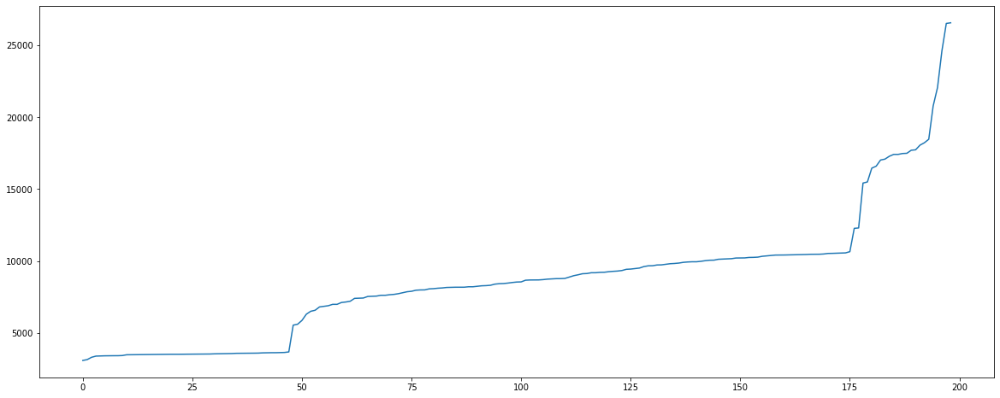

In [1015]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(20,8))
total_elapseds = [ ed['total_elapsed'] for i, ed in enumerate(graph_data)]
plt.plot(range(len(total_elapseds)), total_elapseds)

In [1016]:
valid = df['len_ed']==df['episode_n']

In [1017]:
np.sum(valid)

193

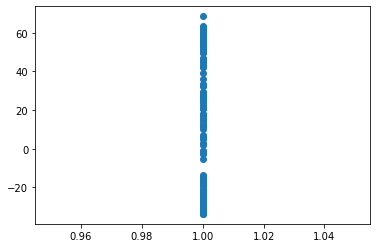

In [1018]:
plt.scatter(df[valid]['layers_cnt'], df[valid]['mean25_ed'])

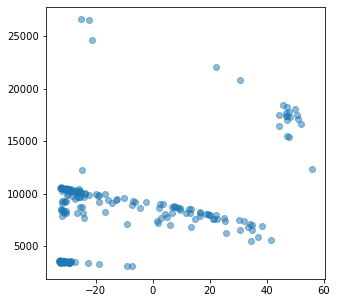

In [1024]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [np.mean(ed['episode_data']) for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

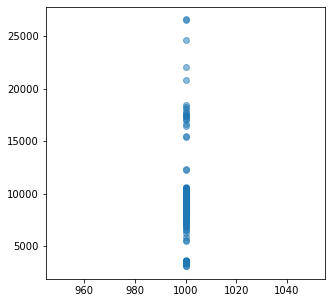

In [1020]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['trajectory_len'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

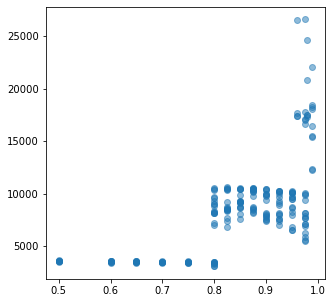

In [1021]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['q_param'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

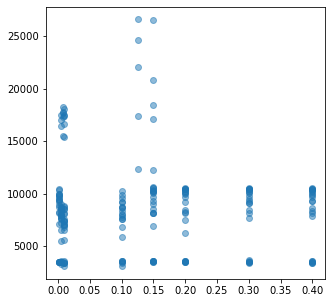

In [1025]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['lr'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

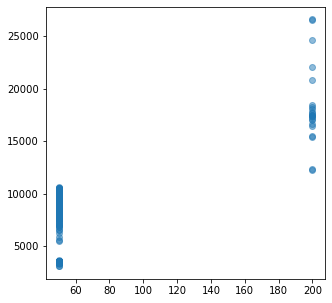

In [1022]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['trajectory_n'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

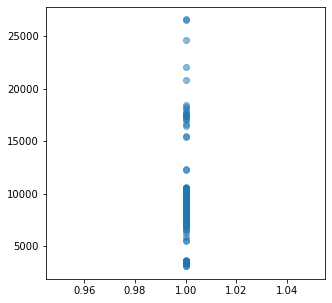

In [1023]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [len(ed['layers_n']) for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

Q Parameter

In [494]:
df

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,65771456929,11,0.150,200,50,1000,0.500,3623.656214,True,200,...,-39.598019,-30.927994,-30.927994,-32.156485,-32.450967,4.008298,1,50,None,None
1,65772251499,11,0.200,200,50,1000,0.500,3563.412664,True,200,...,-39.527885,-32.875247,-32.875247,-32.128155,-32.924760,3.691733,1,50,None,None
2,65773318406,11,0.300,200,50,1000,0.500,3677.951497,True,200,...,-39.528288,-32.458679,-32.458679,-30.920269,-32.052127,4.340452,1,50,None,None
3,65774252849,11,0.400,200,50,1000,0.500,3587.621751,True,200,...,-39.611803,-29.077089,-29.077089,-31.864193,-32.658231,3.857015,1,50,None,None
4,65775238157,11,0.100,200,50,1000,0.500,3624.185472,True,200,...,-39.447066,-31.177327,-31.177327,-31.325184,-31.323147,4.334251,1,50,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,71000558507,13,0.400,400,50,1000,0.975,7896.759211,True,400,...,-41.094718,-31.602580,-40.625351,-24.038131,-23.772577,7.145130,1,100,None,None
172,71037817017,13,0.100,400,50,1000,0.975,5869.773415,True,400,...,-6.262414,36.867827,21.148438,50.989577,51.793675,22.138917,1,100,None,None
173,71076239173,13,0.010,400,50,1000,0.975,5603.157811,True,400,...,15.136737,41.412400,28.500165,56.156445,55.712784,11.728456,1,100,None,None
174,71113395173,13,0.001,400,50,1000,0.975,7114.904076,True,400,...,-11.307189,-9.005322,-18.077683,10.338000,8.185675,8.726390,1,100,None,None


In [498]:
for c in ['lr','episode_n','trajectory_n','trajectory_len','q_param','layers_n1']:
    print(c, list(sorted(df[c].unique())))

lr [0.001, 0.005, 0.01, 0.1, 0.15, 0.2, 0.3, 0.4]
episode_n [200, 400]
trajectory_n [50]
trajectory_len [1000]
q_param [0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.825, 0.85, 0.875, 0.9, 0.925, 0.95, 0.975]
layers_n1 [50, 100]


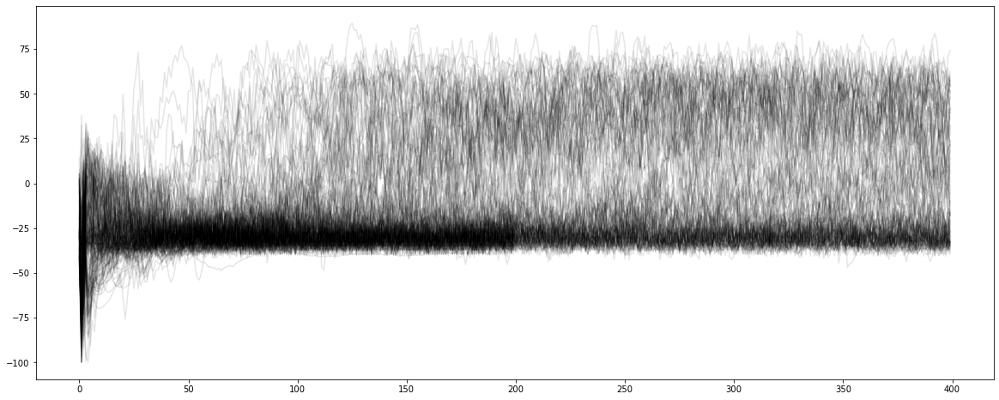

In [722]:
plt.figure(figsize=(20,8))
for i, ed in enumerate(data):
    episode_data = np.array(ed['episode_data'])
#     lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     print(ed['id'], lable,np.max(ed['episode_data']), np.argmax(ed['episode_data']))
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.1,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             color='black',
             label=lable)
# leg = plt.legend(loc='lower left')
ylim = plt.gca().get_ylim()
plt.show()

In [576]:
df100 = df.query('layers_n1==100')
df50 = df.query('layers_n1==50')
df100.shape, df50.shape

((64, 21), (112, 21))

In [578]:
mdf = df100.merge(df50, on=['lr','q_param','trajectory_n', 'trajectory_len', 'episode_n','len_ed'], validate='one_to_many',)

In [580]:
mdf[['meaned_x', 'meaned_y']]

,meaned_x,meaned_y
0,3.638811,-31.171324
1,-32.377266,-31.151131
2,-29.895228,-31.651636
3,-30.070954,-30.299000
4,-9.963943,-31.858959
...,...,...
59,-31.602580,-23.786030
60,36.867827,-22.148345
61,41.412400,33.997689
62,-9.005322,-12.779473


In [131]:
plt.hist(df.query('layers_n1==100')['meaned'].tolist())

UndefinedVariableError: name 'layers_n1' is not defined

In [132]:
from scipy.stats import shapiro, normaltest, chisquare

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from numpy import (exp, inf, pi, sqrt, floor, sin, cos, around, int,


In [133]:
d = mdf['meaned_x'] - mdf['meaned_y']
plt.hist(d, bins=50)
plt.show()
stat, pv = shapiro(d)
print(f'Shapiro-Wilk test:{stat:0.8} p-Value,{pv:0.9}')
stat, pv = normaltest(d)
print(f'D’Agostino’s K-squared:{stat:0.8}, {pv:0.8} ')

NameError: name 'mdf' is not defined

In [ ]:
d = mdf['maxed_x'] - mdf['maxed_y']
stat, pv = shapiro(d)
print('Shapiro-Wilk test:',stat, 'p-Value',f"{pv:0.8}")
stat, pv = normaltest(d)
print('D’Agostino’s K-squared:', stat, pv )
plt.hist(d, bins=50)
plt.show()

In [626]:
d = mdf['maxed_x'] - mdf['maxed_y']
stat, pv = chisquare(d)
print('Сhi Square:',stat, 'p-Value',f"{pv:0.8}")

Сhi Square: 14128.462302018494 p-Value 0.0


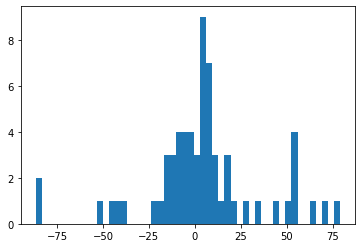

In [616]:
plt.hist(d, bins=50)
plt.show()

(0.0, 1.0)

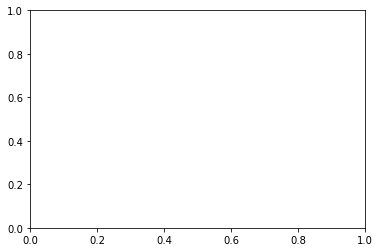

In [653]:
plt.gca().get_ylim()

In [679]:
def box_plot(bygroup):
    fig = plt.figure(figsize =(10, 7))
    ax = fig.add_subplot(111)
    plt.figure(figsize=(10,4))
    box_plt = []
    lables = []
    print(bygroup)
    
    for i, ed in enumerate(data):
        if ed['trajectory_n'] != bygroup: continue
        episode_data = np.array(ed['episode_data'])
        lables.append(str(i+1)+' ' +ed['label'])
        box_plt.append(episode_data[::,0])
    ax.boxplot(box_plt)
#     plt.title(bytype)
    plt.show()
    print('\n'.join(lables))
    return None
    #     plt.hist(episode_data[::,0], alpha=0.2, bins=25)

In [ ]:
fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
plt.figure(figsize=(10,4))
box_plt = []
lables = []
print(name)
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    lables.append(str(i+1)+' ' +ed['label'])
    box_plot(ax, episode_data[::,0], [i], edge_color=type_colors[ed['type']])
plt.show()
    graph_trajectory(list(filter(lambda x: x['type'] == 'Cem', data)), group)

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


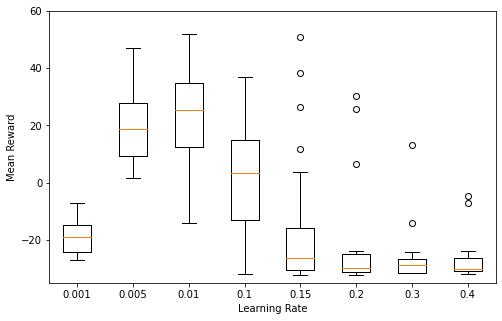

In [980]:
fig = plt.figure(figsize =(8, 5))
ax = fig.add_subplot(111)
box_plots = []
for lr in sorted(g_lr1):
    box_plots.append(df.query(f'lr=={lr} and episode_n==400')['meaned'])
ax.boxplot(box_plots, labels=list(map(str, sorted(g_lr1))))
plt.xlabel('Learning Rate')
plt.ylabel('Mean Reward')
# plt.title('')
plt.ylim((-35, 60))
plt.show()


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


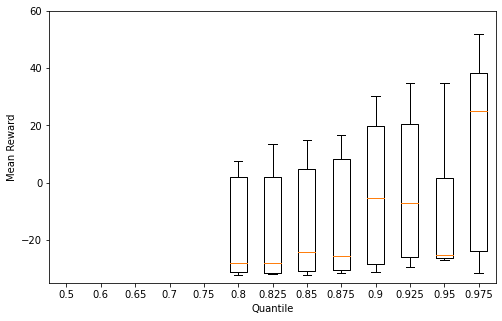

In [1012]:
fig = plt.figure(figsize =(8, 5))
ax = fig.add_subplot(111)
box_plots = []
for q_param in sorted(g_q_params1):
    box_plots.append(df.query(f'q_param=={q_param} and episode_n==400')['meaned'])
ax.boxplot(box_plots, labels=list(map(str, sorted(g_q_params1))))
plt.xlabel('Quantile')
plt.ylabel('Mean Reward')
plt.ylim((-35, 60))
plt.show()


In [802]:
g_lr

{'0.001', '0.005', '0.01', '0.1', '0.15', '0.2', '0.3', '0.4'}

0 0 0
1 0 1


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


2 1 0
3 1 1


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


4 2 0
5 2 1


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


6 3 0
7 3 1


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


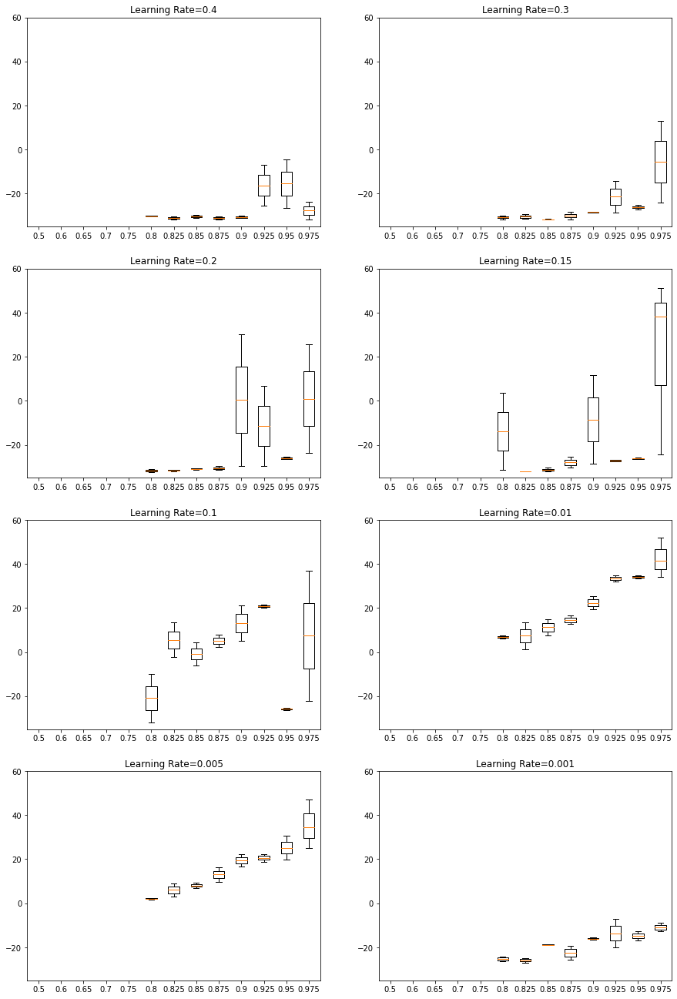

In [988]:
fig, ax = plt.subplots(4,2, figsize=(15,23))
coords = [[0,0],[0,1],[1,0],[1,1],[2,0],[2,1],[3,0],[3,1]]

for i, lr in enumerate(sorted(g_lr1,reverse=True)):
#     print(lr)
#     fig = plt.figure(figsize =(10, 7))
#     ax = fig.add_subplot(111)
    box_plots = []

    for q_param in sorted(g_q_params1):
        box_plots.append(df.query(f'q_param=={q_param} and episode_n==400 and lr=={lr}')['meaned'])
    x,y = coords[i]
    print(i,x,y)
    ax[x,y].boxplot(box_plots, labels=list(map(str, sorted(g_q_params1))))
    ax[x,y].set_title(f'Learning Rate={lr}')
    ax[x,y].set_ylim((-35, 60))
#     ax[x,y].set_xlim((0.5, 1))
#     plt.ylim((-35, 60))

#     ax[x,y].set_xticks(range(1, len(g_lr)+1), sorted(g_lr,reverse=True), rotation=45, ha='right')

#     ax[x,y].xticks(rotation=45)
# plt.title(f'Episodes Mean with Lr={lr} Episode_N=400 ')
# fig.autofmt_xdate(rotation=45)
plt.show()

In [947]:
fdf = df.query('lr<=0.01 and episode_n==400 and q_param >=0.9')
fdf

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
85,68563901984,12,0.0100,400,50,1000,0.900,8109.844507,True,400,...,1.412292,19.405989,3.418865,25.461011,28.136928,14.430180,1,50,None,None
86,68577748804,12,0.0010,400,50,1000,0.900,9949.607186,True,400,...,-17.591108,-16.661516,-24.542052,-1.061109,-0.894792,7.795516,1,50,None,None
87,68591586714,12,0.0050,400,50,1000,0.900,7988.942648,True,400,...,24.507744,22.280602,-1.648697,49.883006,49.160039,9.317239,1,50,None,None
93,68682978133,12,0.0100,400,50,1000,0.925,7416.258458,True,400,...,29.092516,31.990777,14.841789,53.291960,51.104011,8.309830,1,50,None,None
94,68697817383,12,0.0010,400,50,1000,0.925,9934.880426,True,400,...,-27.172697,-19.985735,-27.876292,-2.181679,-5.001292,9.634030,1,50,None,None
95,68711309481,12,0.0050,400,50,1000,0.925,8078.739081,True,400,...,21.526037,18.715510,-11.445574,46.819448,46.197133,9.094719,1,50,None,None
101,68796186114,12,0.0100,400,50,1000,0.950,6806.808478,True,400,...,7.908864,33.237595,17.036448,56.847250,53.169186,10.200043,1,50,None,None
102,68809635760,12,0.0010,400,50,1000,0.950,9478.382501,True,400,...,-19.975823,-12.629832,-19.483729,2.876684,1.360437,10.052874,1,50,None,None
103,68824269880,12,0.0050,400,50,1000,0.950,7992.963728,True,400,...,27.686935,19.786641,-5.439215,49.941020,47.889223,9.318374,1,50,None,None
109,68917656421,12,0.0100,400,50,1000,0.975,7150.666041,True,400,...,24.552023,33.997689,14.211514,57.971843,57.335162,6.405665,1,50,None,None


In [1026]:
Normalize

matplotlib.colors.Normalize

In [1027]:
cm

<module 'matplotlib.cm' from '/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/matplotlib/cm.py'>

{0.0075, 0.001, 0.01, 0.005}


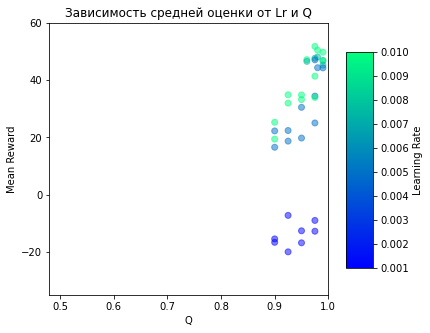

In [996]:
graph_data = []
fdf_ids = fdf['id'].tolist()
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
    if not (ed['id'] in fdf_ids): continue
    graph_data.append(ed)
plt.figure(figsize=(5,5))
ms = []
qs = []
lrs = []

for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    ms.append(np.mean(episode_data))
    qs.append(ed['q_param'])
    lrs.append(ed['lr'])
#     lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     print(ed['id'], lable)
#     plt.plot(range(len(episode_data)), 
#              episode_data,
#              alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
# #              linestyle=listyles[ed['type']],
# #              linestyle = 'dashed' if i > 6 else 'solid',
#              label=lable)

set_lrs = set(lrs)
print(set_lrs)
norm = Normalize(vmin=min(set_lrs), vmax=max(set_lrs))
m = cm.ScalarMappable(norm=norm, cmap=cmap)

plt.scatter(qs, ms, 
#             s=np.array(lrs)*10000, 
            c=m.to_rgba(lrs),
            alpha=0.5)
# leg = plt.legend(loc='lower right')
# plt.ylim(ylim)
plt.xlim((0.48, 1.0))
plt.ylim((-35,60))
plt.xlabel("Q")
plt.ylabel("Mean Reward")
plt.title('Зависимость средней оценки от Lr и Q')

cax = plt.axes([0.95, 0.2, 0.075, 0.6])
plt.colorbar(mappable=m, cax=cax)

plt.ylabel("Learning Rate")
plt.show()

In [736]:
df.query('version=="14"')

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
176,77770533742,14,0.005,400,200,1000,0.975,13086.155364,False,298,...,40.681252,43.166797,34.941051,59.753791,60.937676,7.459393,1,200,None,None
177,77805012410,14,0.005,400,200,1000,0.980,13093.580259,False,287,...,34.719560,38.928268,30.205964,58.259036,58.566750,9.971379,1,200,None,None
178,77830043585,14,0.005,400,200,1000,0.990,13091.222615,False,295,...,38.777256,40.750354,31.801636,56.607780,57.303212,7.349353,1,200,None,None


In [739]:
fdf = df.query('q_param =0.9')
fdf

ValueError: cannot assign without a target object

68866188997 lr:0.3 Q:0.975 tn:50 ln:[50] t_len:1000
70720468754 lr:0.4 Q:0.95 tn:50 ln:[100] t_len:1000
70410068197 lr:0.3 Q:0.925 tn:50 ln:[100] t_len:1000
68666199134 lr:0.1 Q:0.925 tn:50 ln:[50] t_len:1000
71037817017 lr:0.1 Q:0.975 tn:50 ln:[100] t_len:1000
68514409868 lr:0.2 Q:0.9 tn:50 ln:[50] t_len:1000
68837581774 lr:0.15 Q:0.975 tn:50 ln:[50] t_len:1000
70787338684 lr:0.01 Q:0.95 tn:50 ln:[100] t_len:1000
70931428079 lr:0.2 Q:0.975 tn:50 ln:[100] t_len:1000
70477708732 lr:0.1 Q:0.925 tn:50 ln:[100] t_len:1000
68550800701 lr:0.1 Q:0.9 tn:50 ln:[50] t_len:1000
71150766923 lr:0.005 Q:0.975 tn:50 ln:[100] t_len:1000
77805012410 lr:0.005 Q:0.98 tn:200 ln:[200] t_len:1000
71076239173 lr:0.01 Q:0.975 tn:50 ln:[100] t_len:1000
70082322609 lr:0.15 Q:0.9 tn:50 ln:[100] t_len:1000
70581076837 lr:0.005 Q:0.925 tn:50 ln:[100] t_len:1000
70243955302 lr:0.01 Q:0.9 tn:50 ln:[100] t_len:1000
70511984977 lr:0.01 Q:0.925 tn:50 ln:[100] t_len:1000
77770533742 lr:0.005 Q:0.975 tn:200 ln:[200] t_le

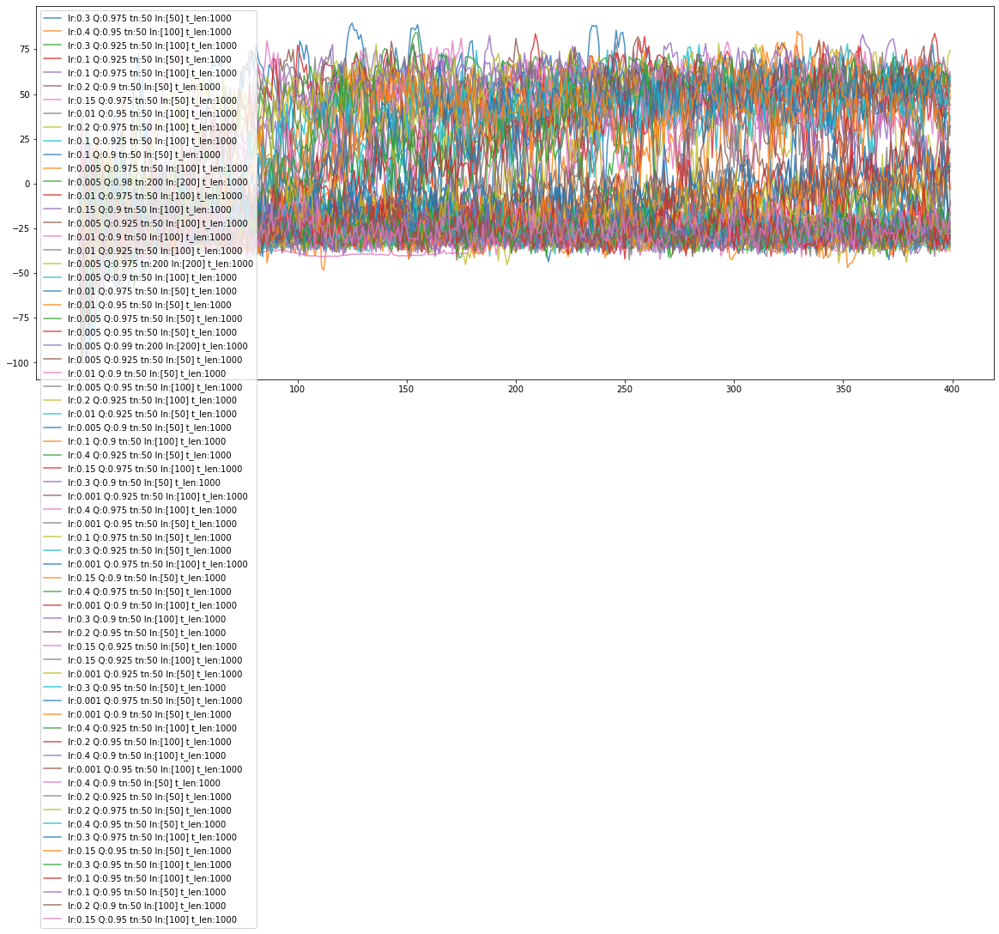

In [740]:
graph_data = []
fdf_ids = fdf['id'].tolist()
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
    if not (ed['id'] in fdf_ids): continue
    graph_data.append(ed)
# graph_data = graph_data[:5]
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='upper left')
plt.ylim(ylim)
plt.show()

In [467]:
best_of_the_best = []

In [484]:
lr_candidates = [
'68866188997',
'70720468754',
'68448510492',
'70410068197',
'68666199134',
'71037817017',
'68514409868',
]

In [468]:
for d in data:
    arr = d['episode_data']
    if np.max(arr)>0:
        best_of_the_best.append(d['id'])
    print(d['id'], np.max(arr))

65771456929 13.627231614856361
65772251499 -3.507811552388782
65773318406 -2.5370639858624715
65774252849 21.987288485037787
65775238157 -6.28797156205219
65776255695 -3.531501375758872
65777615538 -11.035762312587497
65779145087 1.1501086812057273
65780578155 -2.8273444066568594
65783725084 22.315950356615218
65785992767 10.458025212840507
65788026523 27.978514574560663
65791966319 30.242039601367427
65795149451 -12.01101531927529
65797576931 5.891534655999643
65801139728 -18.516696594239093
65804087001 -11.350059148389901
65807916216 -7.932809904101289
65813250612 14.180043859204812
65816909985 8.325593789063122
65820281747 1.465902195495221
65824887148 -15.649371312299541
65828600011 -20.737199655037898
65832600528 -13.36904967013379
65837600965 0.707860148910985
65841958926 -18.28930925053797
65847433906 12.825914178482368
65853274172 9.826599918147572
65859335449 -11.358111471244142
65865452139 -4.330778614199508
65871017047 -9.984936859180024
65878132468 6.680331143898668
6588414

In [519]:
lr_candidates = [
'70581076837',
'70858516335',
'71150766923'


]

65968560182 lr:0.1 Q:0.8 tn:50 ln:[50] t_len:1000
65977734402 lr:0.01 Q:0.8 tn:50 ln:[50] t_len:1000
65791966319 lr:0.1 Q:0.6 tn:50 ln:[50] t_len:1000
65788026523 lr:0.4 Q:0.6 tn:50 ln:[50] t_len:1000
65891992335 lr:0.2 Q:0.75 tn:50 ln:[50] t_len:1000


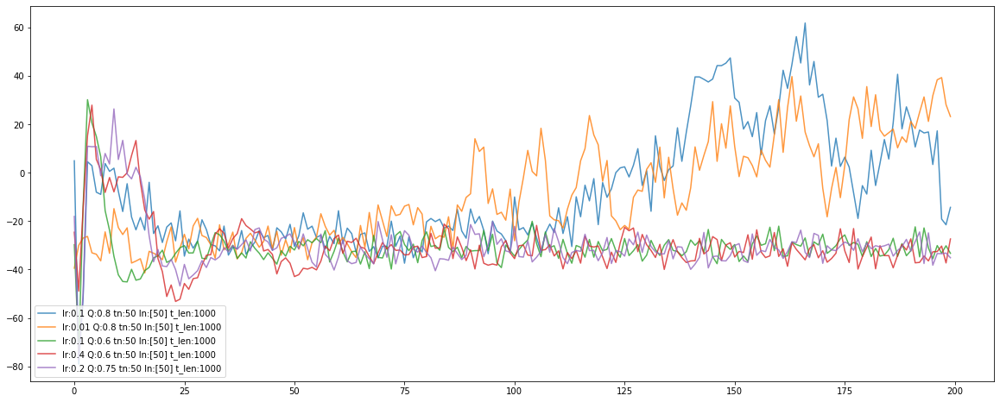

In [437]:

# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
    if ed['version']!='11':continue
    if not (ed['id'] in best_of_the_best): continue
    graph_data.append(ed)
graph_data = graph_data[:5]
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower left')


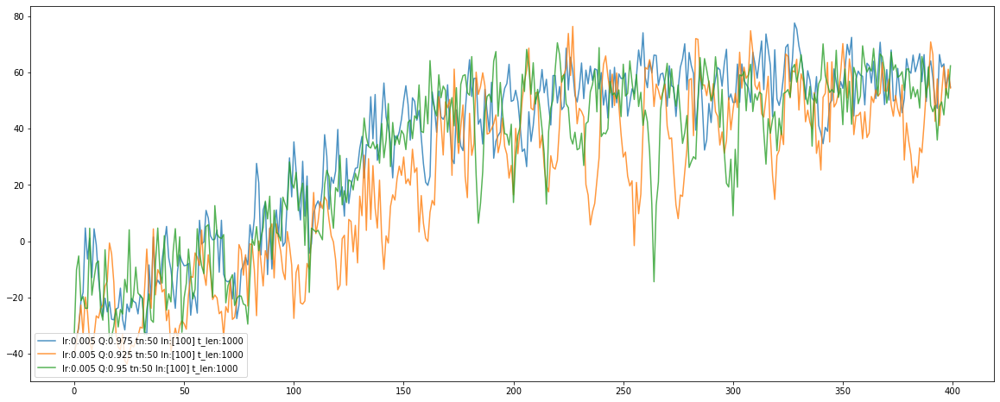

In [521]:
graph_data = []
for ed in data:
    if not (ed['id'] in lr_candidates): continue
    graph_data.append(ed)
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
    if not (ed['id'] in lr_candidates): continue
    graph_data.append(ed)
# graph_data = graph_data[:2]
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     print(ed['id'], lable,np.max(ed['episode_data']), np.argmax(ed['episode_data']))
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower left')


In [522]:
df

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,65771456929,11,0.150,200,50,1000,0.500,3623.656214,True,200,...,-39.598019,-30.927994,-30.927994,-32.156485,-32.450967,4.008298,1,50,None,None
1,65772251499,11,0.200,200,50,1000,0.500,3563.412664,True,200,...,-39.527885,-32.875247,-32.875247,-32.128155,-32.924760,3.691733,1,50,None,None
2,65773318406,11,0.300,200,50,1000,0.500,3677.951497,True,200,...,-39.528288,-32.458679,-32.458679,-30.920269,-32.052127,4.340452,1,50,None,None
3,65774252849,11,0.400,200,50,1000,0.500,3587.621751,True,200,...,-39.611803,-29.077089,-29.077089,-31.864193,-32.658231,3.857015,1,50,None,None
4,65775238157,11,0.100,200,50,1000,0.500,3624.185472,True,200,...,-39.447066,-31.177327,-31.177327,-31.325184,-31.323147,4.334251,1,50,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,71000558507,13,0.400,400,50,1000,0.975,7896.759211,True,400,...,-41.094718,-31.602580,-40.625351,-24.038131,-23.772577,7.145130,1,100,None,None
172,71037817017,13,0.100,400,50,1000,0.975,5869.773415,True,400,...,-6.262414,36.867827,21.148438,50.989577,51.793675,22.138917,1,100,None,None
173,71076239173,13,0.010,400,50,1000,0.975,5603.157811,True,400,...,15.136737,41.412400,28.500165,56.156445,55.712784,11.728456,1,100,None,None
174,71113395173,13,0.001,400,50,1000,0.975,7114.904076,True,400,...,-11.307189,-9.005322,-18.077683,10.338000,8.185675,8.726390,1,100,None,None


(array([26.,  5.,  3.,  5.,  4.,  7.,  3.,  5.,  1.,  5.]),
 array([-32.37726636, -24.99829977, -17.61933317, -10.24036658,
         -2.86139999,   4.51756661,  11.8965332 ,  19.2754998 ,
         26.65446639,  34.03343298,  41.41239958]),
 <a list of 10 Patch objects>)

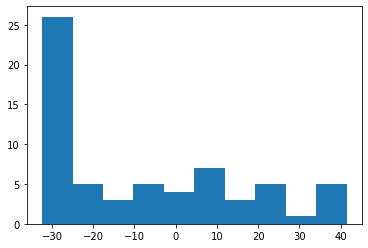

In [527]:
plt.hist(df.query('layers_n1==100')['meaned'].tolist())

In [ ]:
groups = {
}
for d in data:
    group = d['layers_n'][0]
    key =f"{d['q_param']} {d['trajectory_n']} {d['trajectory_len']}"
    
    compare[key] = 
    key

(array([26.,  5.,  3.,  5.,  4.,  7.,  3.,  5.,  1.,  5.]),
 array([-32.37726636, -24.99829977, -17.61933317, -10.24036658,
         -2.86139999,   4.51756661,  11.8965332 ,  19.2754998 ,
         26.65446639,  34.03343298,  41.41239958]),
 <a list of 10 Patch objects>)

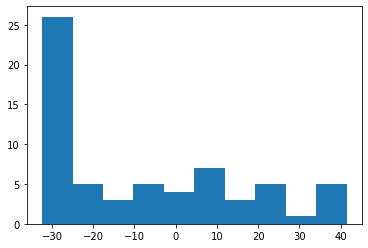

In [563]:
plt.hist(df.query('layers_n1==100')['meaned'].tolist())

(array([71., 11.,  3.,  3.,  2.,  6.,  5.,  5.,  2.,  4.]),
 array([-32.87524653, -25.76873407, -18.66222161, -11.55570915,
         -4.44919669,   2.65731577,   9.76382823,  16.87034068,
         23.97685314,  31.0833656 ,  38.18987806]),
 <a list of 10 Patch objects>)

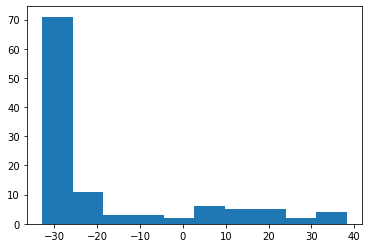

In [564]:
plt.hist(df.query('layers_n1==50')['meaned'].tolist())

In [438]:
winner = list(filter(lambda x: x['id'] == '65968560182', data))
np.argmax(winner[0]['episode_data'])

166

In [439]:
set([d['version'] for d in data])

{'11', '12', '13'}

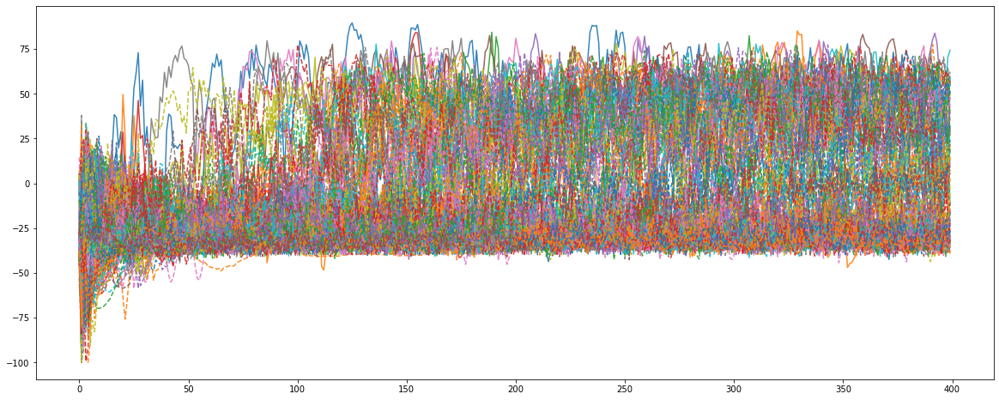

In [440]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]

# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data']))):
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     print(ed['id'], lable)

    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 10 else 'solid',
             label=lable)
# leg = plt.legend(loc='lower right')


In [445]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['mean25_ed'])):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
    if ed['version']!='12':continue
#     if not (ed['id'] in best_of_the_best): continue
    graph_data.append(ed)
graph_data = graph_data[:10]
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
# leg = plt.legend(loc='lower left')


KeyError: 'mean25_ed'

70720468754 lr:0.4 Q:0.95 tn:50 ln:[100] t_len:1000
70410068197 lr:0.3 Q:0.925 tn:50 ln:[100] t_len:1000
71037817017 lr:0.1 Q:0.975 tn:50 ln:[100] t_len:1000
70787338684 lr:0.01 Q:0.95 tn:50 ln:[100] t_len:1000
70931428079 lr:0.2 Q:0.975 tn:50 ln:[100] t_len:1000
70477708732 lr:0.1 Q:0.925 tn:50 ln:[100] t_len:1000
71150766923 lr:0.005 Q:0.975 tn:50 ln:[100] t_len:1000
71076239173 lr:0.01 Q:0.975 tn:50 ln:[100] t_len:1000
70082322609 lr:0.15 Q:0.9 tn:50 ln:[100] t_len:1000
70581076837 lr:0.005 Q:0.925 tn:50 ln:[100] t_len:1000
70243955302 lr:0.01 Q:0.9 tn:50 ln:[100] t_len:1000
70511984977 lr:0.01 Q:0.925 tn:50 ln:[100] t_len:1000
69988448344 lr:0.01 Q:0.875 tn:50 ln:[100] t_len:1000
70309241614 lr:0.005 Q:0.9 tn:50 ln:[100] t_len:1000
69958348013 lr:0.1 Q:0.875 tn:50 ln:[100] t_len:1000
70858516335 lr:0.005 Q:0.95 tn:50 ln:[100] t_len:1000
70375171835 lr:0.2 Q:0.925 tn:50 ln:[100] t_len:1000
70209425527 lr:0.1 Q:0.9 tn:50 ln:[100] t_len:1000
70049965399 lr:0.005 Q:0.875 tn:50 ln:[100]

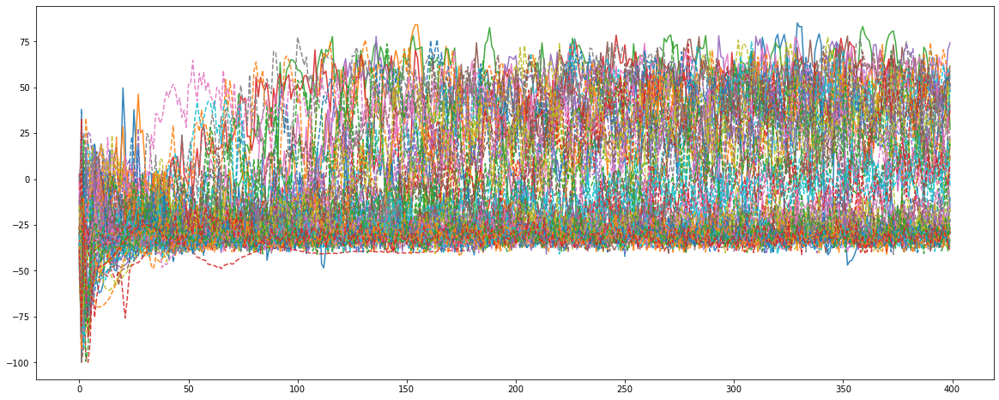

In [442]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
    if ed['version']!='13':continue
#     if not (ed['id'] in best_of_the_best): continue
    graph_data.append(ed)
graph_data = graph_data
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
# leg = plt.legend(loc='lower left')


68866188997 lr:0.3 Q:0.975 tn:50 ln:[50] t_len:1000


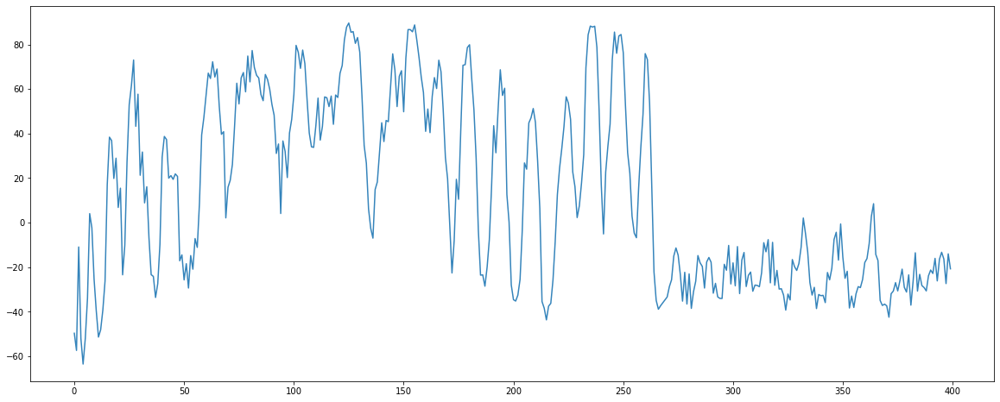

In [400]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
    if ed['version']!='12':continue
    if not (ed['id'] in ['68866188997']): continue
    graph_data.append(ed)
graph_data = graph_data
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
# leg = plt.legend(loc='lower left')


In [401]:
winner = list(filter(lambda x: x['id'] == '68866188997', data))
np.argmax(winner[0]['episode_data'])

125

78945001359 lr:0.01 Q:0.975 tn:200 ln:[200] t_len:1000
78840611330 lr:0.01 Q:0.96 tn:200 ln:[200] t_len:1000
79029923430 lr:0.0075 Q:0.98 tn:200 ln:[200] t_len:1000
78998331192 lr:0.15 Q:0.975 tn:200 ln:[200] t_len:1000
78863754286 lr:0.125 Q:0.96 tn:200 ln:[200] t_len:1000
77805012410 lr:0.005 Q:0.98 tn:200 ln:[200] t_len:1000
78919077294 lr:0.0075 Q:0.975 tn:200 ln:[200] t_len:1000
79053646806 lr:0.01 Q:0.98 tn:200 ln:[200] t_len:1000
79212862259 lr:0.15 Q:0.99 tn:200 ln:[200] t_len:1000
79160893013 lr:0.01 Q:0.99 tn:200 ln:[200] t_len:1000
79134281267 lr:0.0075 Q:0.99 tn:200 ln:[200] t_len:1000
77770533742 lr:0.005 Q:0.975 tn:200 ln:[200] t_len:1000
78811756764 lr:0.0075 Q:0.96 tn:200 ln:[200] t_len:1000
77830043585 lr:0.005 Q:0.99 tn:200 ln:[200] t_len:1000
79107052837 lr:0.15 Q:0.98 tn:200 ln:[200] t_len:1000
79185073744 lr:0.125 Q:0.99 tn:200 ln:[200] t_len:1000
79272434688 lr:0.01 Q:0.99 tn:200 ln:[200] t_len:1000
79079968561 lr:0.125 Q:0.98 tn:200 ln:[200] t_len:1000
7923891593

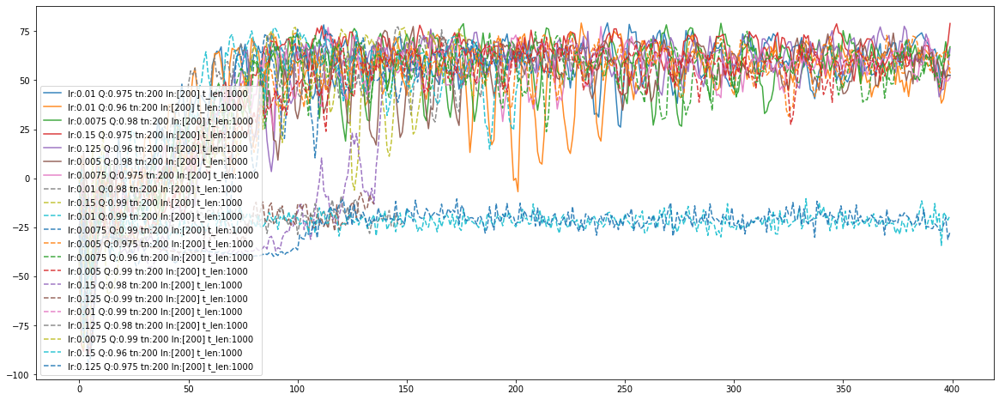

In [851]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
    if not( ed['version']in('14','15')):continue
    graph_data.append(ed)
graph_data = graph_data
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower left')


In [838]:
g_lr

{'0.001',
 '0.005',
 '0.0075',
 '0.01',
 '0.1',
 '0.125',
 '0.15',
 '0.2',
 '0.3',
 '0.4'}

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


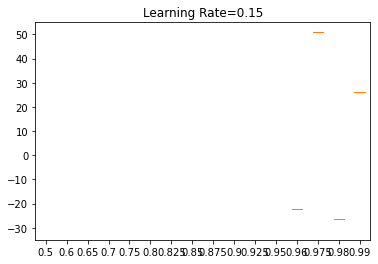

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


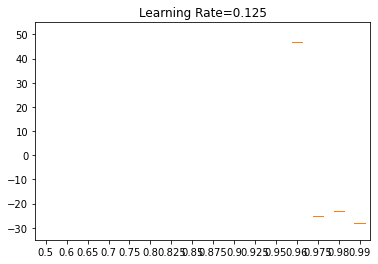

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


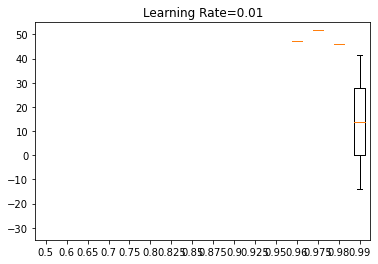

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


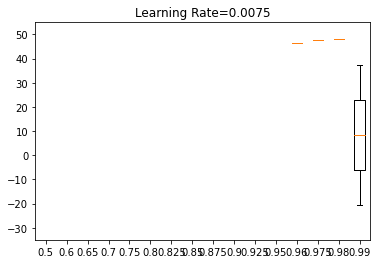

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


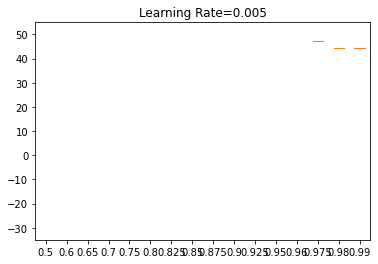

In [852]:
# fig, ax = plt.subplots(4,2, figsize=(15,23))
coords = [[0,0],[0,1],[1,0],[1,1],[2,0],[2,1],[3,0],[3,1]]

for i, lr in enumerate(sorted(g_lr,reverse=True)):
#     print(lr)

#     fig = plt.figure(figsize =(10, 7))
#     ax = fig.add_subplot(111)
    
    box_plots = []

    for q_param in sorted(g_q_params):
        meaned = df.query(f'version in("14","15") and q_param=={q_param} and episode_n==400 and lr=={lr}')['meaned']
#         if len(meaned)>0:
        box_plots.append(meaned.to_list())
    if len(box_plots)==0:
        continue

#     x,y = coords[i]
    if np.sum(box_plots)==0:continue
    plt.boxplot(box_plots, labels=list(map(str, sorted(g_q_params))))
    plt.title(f'Learning Rate={lr}')
    plt.ylim((-35, 55))
#     print(i,x,y)
    plt.show()
#     ax[x,y].boxplot(box_plots, labels=list(map(str, sorted(g_q_params))))
#     ax[x,y].set_title(f'Learning Rate={lr}')
#     ax[x,y].set_ylim((-35, 45))

#     ax[x,y].xticks(rotation=45)
# plt.title(f'Episodes Mean with Lr={lr} Episode_N=400 ')
# fig.autofmt_xdate(rotation=45)
plt.show()

In [859]:
ed['lr']==0.001

True

0.001
0.005
77830043585 214 lr:0.005 Q:0.99 tn:200 ln:[200] t_len:1000
77805012410 153 lr:0.005 Q:0.98 tn:200 ln:[200] t_len:1000
77770533742 225 lr:0.005 Q:0.975 tn:200 ln:[200] t_len:1000
0.0075
79134281267 113 lr:0.0075 Q:0.99 tn:200 ln:[200] t_len:1000
79238915934 0 lr:0.0075 Q:0.99 tn:200 ln:[200] t_len:1000
79029923430 294 lr:0.0075 Q:0.98 tn:200 ln:[200] t_len:1000
78919077294 239 lr:0.0075 Q:0.975 tn:200 ln:[200] t_len:1000
78811756764 306 lr:0.0075 Q:0.96 tn:200 ln:[200] t_len:1000
0.01
79160893013 89 lr:0.01 Q:0.99 tn:200 ln:[200] t_len:1000
79272434688 8 lr:0.01 Q:0.99 tn:200 ln:[200] t_len:1000
79053646806 146 lr:0.01 Q:0.98 tn:200 ln:[200] t_len:1000
78945001359 242 lr:0.01 Q:0.975 tn:200 ln:[200] t_len:1000
78840611330 230 lr:0.01 Q:0.96 tn:200 ln:[200] t_len:1000
0.1
0.125
79185073744 2 lr:0.125 Q:0.99 tn:200 ln:[200] t_len:1000
79079968561 0 lr:0.125 Q:0.98 tn:200 ln:[200] t_len:1000
78974017509 2 lr:0.125 Q:0.975 tn:200 ln:[200] t_len:1000
78863754286 378 lr:0.125 Q:0.

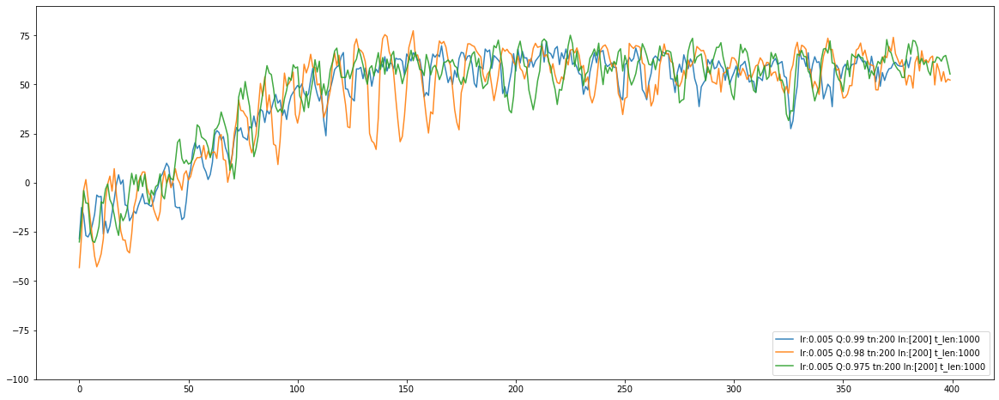

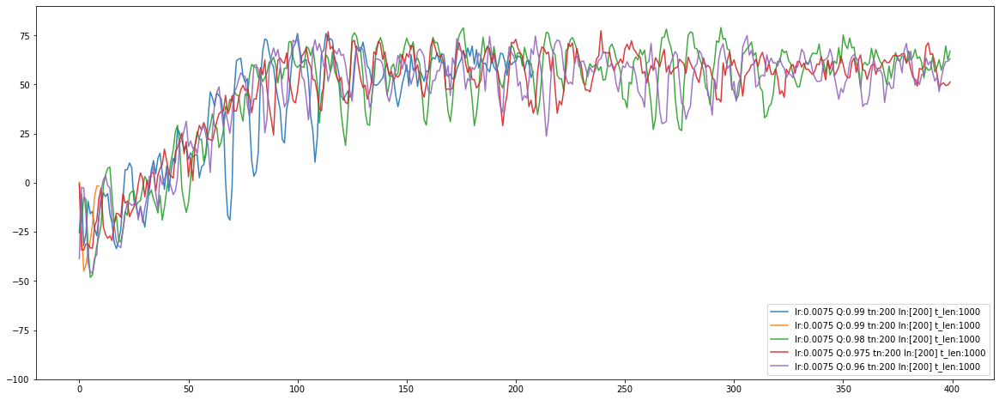

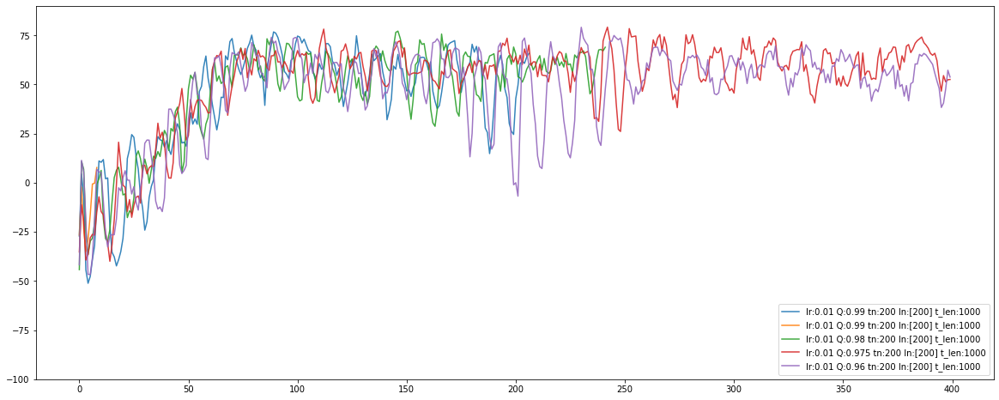

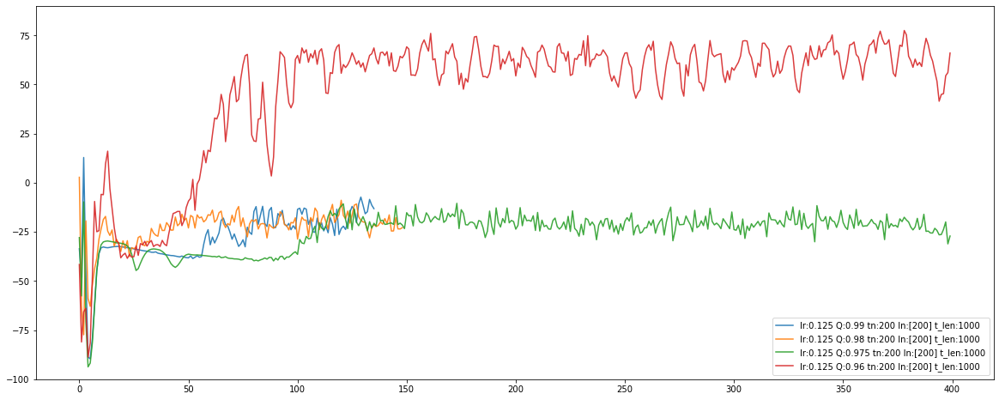

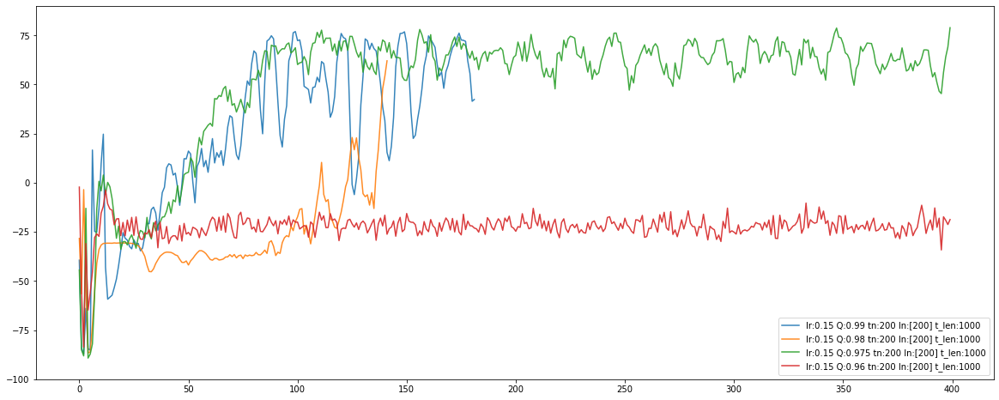

In [880]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
for lr in sorted(g_lr):
    print(lr)
    graph_data = []
    for ed in sorted(data, key=lambda x:-np.max(x['q_param'])):
        if not( ed['version']in('14','15')): continue
        if str(ed['lr'])!=str(lr): continue
        graph_data.append(ed)
#         print(ed['lr'])
        
    if len(graph_data)==0:continue
    graph_data = graph_data
    plt.figure(figsize=(20,8))
    plt.ylim((-100,90))
    for i, ed in enumerate(graph_data):

        episode_data = np.array(ed['episode_data'])
        m = np.round(np.mean(episode_data),2)
        s =  np.round(np.std(episode_data),2)
        n = np.argmax(episode_data)
        lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
        print(ed['id'],n, lable)
        plt.plot(range(len(episode_data)), 
                 episode_data,
                 alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
    #              linestyle=listyles[ed['type']],
                 linestyle = 'dashed' if i > 6 else 'solid',
                 label=lable)
    leg = plt.legend(loc='lower right')


In [928]:
fdf.columns

Index(['id', 'version', 'lr', 'episode_n', 'trajectory_n', 'trajectory_len',
       'q_param', 'total_elapsed', 'finished', 'len_ed', 'maxed', 'min70',
       'meaned', 'mean200_ed', 'mean25_ed', 'mean50_ed', 'std_ed',
       'layers_cnt', 'layers_n1', 'layers_n2', 'layers_n3'],
      dtype='object')

In [1001]:
fdf.shape

(21, 21)

In [1008]:
fdf = df.query('version in ("14","15")')
fdf[['lr','episode_n','trajectory_n','trajectory_len','q_param','layers_n1', 'meaned','maxed','std_ed']].sort_values('meaned', ascending=False).reset_index(drop=True)

,lr,episode_n,trajectory_n,trajectory_len,q_param,layers_n1,meaned,maxed,std_ed
0,0.1250,400,200,1000,0.990,200,55.954001,80.420275,4.484298
1,0.0100,400,200,1000,0.975,200,51.813076,79.202570,7.443827
2,0.1500,400,200,1000,0.975,200,51.008727,78.915701,6.571542
3,0.0100,400,200,1000,0.980,200,50.501530,77.188026,5.312449
4,0.0100,400,200,1000,0.990,200,49.772590,78.182561,14.487606
5,0.0075,400,200,1000,0.980,200,48.107366,79.029629,5.479761
6,0.0100,400,200,1000,0.990,200,47.752600,75.713705,5.956383
7,0.0075,400,200,1000,0.975,200,47.691673,77.376719,5.520585
8,0.0100,400,200,1000,0.960,200,47.192096,79.136772,7.337331
9,0.0050,400,200,1000,0.975,200,47.112632,75.086075,5.337523


In [1009]:
fdf

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
176,77770533742,14,0.0050,400,200,1000,0.975,17027.099569,True,400,...,41.632735,47.112632,34.941051,62.007607,61.453786,5.337523,1,200,None,None
177,77805012410,14,0.0050,400,200,1000,0.980,17480.512069,True,400,...,43.157667,44.375139,30.205964,57.761709,58.644039,7.546818,1,200,None,None
178,77830043585,14,0.0050,400,200,1000,0.990,16462.636350,False,382,...,27.534930,44.315393,31.801636,59.032253,57.801071,5.563455,1,200,None,None
179,78811756764,15,0.0075,400,200,1000,0.960,17707.715496,True,400,...,38.816661,46.585191,37.209974,58.347445,55.645032,7.655884,1,200,None,None
180,78840611330,15,0.0100,400,200,1000,0.960,17418.526363,True,400,...,38.330555,47.192096,39.836177,54.145208,54.481873,7.337331,1,200,None,None
181,78863754286,15,0.1250,400,200,1000,0.960,17418.470847,True,400,...,41.507386,46.797835,31.603064,61.500843,63.573932,8.388949,1,200,None,None
182,78887028594,15,0.1500,400,200,1000,0.960,26528.996997,True,400,...,-34.196160,-22.391005,-22.901045,-21.699018,-22.182347,3.885031,1,200,None,None
183,78919077294,15,0.0075,400,200,1000,0.975,17738.368243,True,400,...,49.024261,47.691673,36.886292,58.471535,58.941668,5.520585,1,200,None,None
184,78945001359,15,0.0100,400,200,1000,0.975,16598.999699,True,400,...,40.601758,51.813076,43.134769,63.590784,61.457822,7.443827,1,200,None,None
185,78974017509,15,0.1250,400,200,1000,0.975,26574.640701,True,400,...,-31.105153,-25.225068,-29.424638,-22.755814,-21.816156,3.337170,1,200,None,None


[0.005, 0.0075, 0.01, 0.125, 0.15]


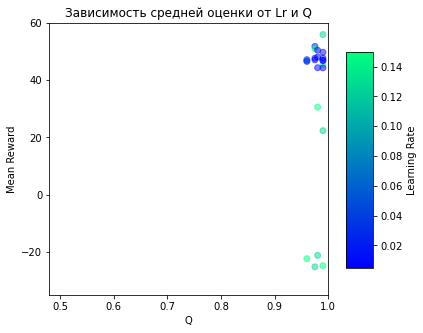

In [1010]:
cmap = cm.winter

graph_data = []
fdf_ids = fdf['id'].tolist()
for ed in sorted(data, key=lambda x:-np.max(x['episode_data'])):
    if not (ed['id'] in fdf_ids): continue
    graph_data.append(ed)
plt.figure(figsize=(5,5))
ms = []
qs = []
lrs = []


for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    ms.append(np.mean(episode_data))
    qs.append(ed['q_param'])
    lrs.append(ed['lr'])
#     lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     print(ed['id'], lable)
#     plt.plot(range(len(episode_data)), 
#              episode_data,
#              alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
# #              linestyle=listyles[ed['type']],
# #              linestyle = 'dashed' if i > 6 else 'solid',
#              label=lable)
set_lrs = set(lrs)
print(list(sorted(set_lrs)))
norm = Normalize(vmin=min(set_lrs), vmax=max(set_lrs))
m = cm.ScalarMappable(norm=norm, cmap=cmap)
# print()
plt.scatter(qs, ms, 
            c=m.to_rgba(lrs),
            alpha=0.5)
# leg = plt.legend(loc='lower right')
# plt.ylim(ylim)
plt.xlabel("Q")
plt.ylabel("Mean Reward")
plt.title('Зависимость средней оценки от Lr и Q')
plt.xlim((0.48, 1.0))
plt.ylim((-35,60))
cax = plt.axes([0.95, 0.2, 0.075, 0.6])
plt.colorbar(mappable=m, cax=cax)
plt.ylabel("Learning Rate")
plt.show()

In [1011]:
best_of_the_best = fdf.sort_values('meaned', ascending=False).reset_index(drop=True)['id'].tolist()[:3]

78998331192 lr:0.15 Q:0.975 tn:200 ln:[200] t_len:1000


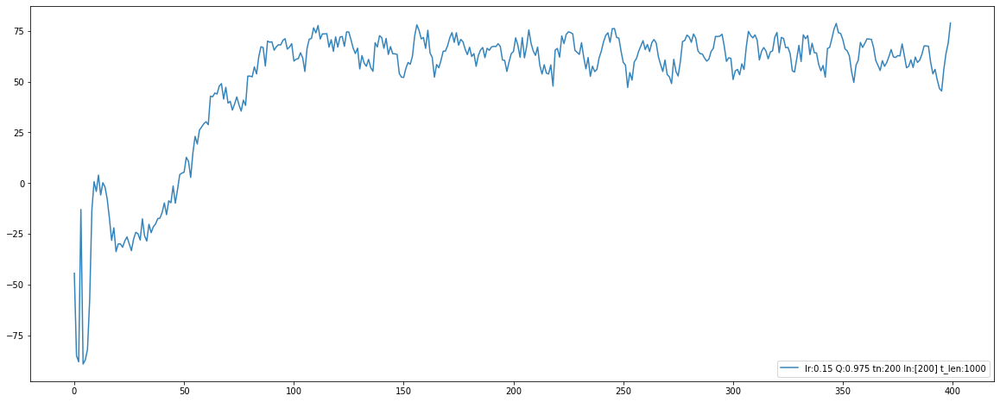

In [945]:
best_of_the_best
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-np.max(x['q_param'])):
#     if not( ed['version']in('14','15')):continue
    if not(ed['id'] in ['78998331192']):continue
    graph_data.append(ed)
graph_data = graph_data
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    
    episode_data = np.array(ed['episode_data'])
    lable = f"lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data,
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')


In [907]:
norm(0.125)

0.8275862068965517

In [881]:
winner[0]['episode_data'][158]

27.686772693242553